### Problem Statement:

- To find the most promising leads i.e. the leads that are most likely to convert into paying customer.
- This is a classification problem, where in we need to build a model to assign lead score to each of the leads such that the customer with higher lead score has higher conversion chance and customer with lower lead score has lower conversion chance
- The company wants to utilize their resources optimally such that the lead coversion rate to be around 80% (we need to have suitable cutoff of the lead score and identify the potential leads such that lead conversion rate would be greater than 80%)


### Data Set


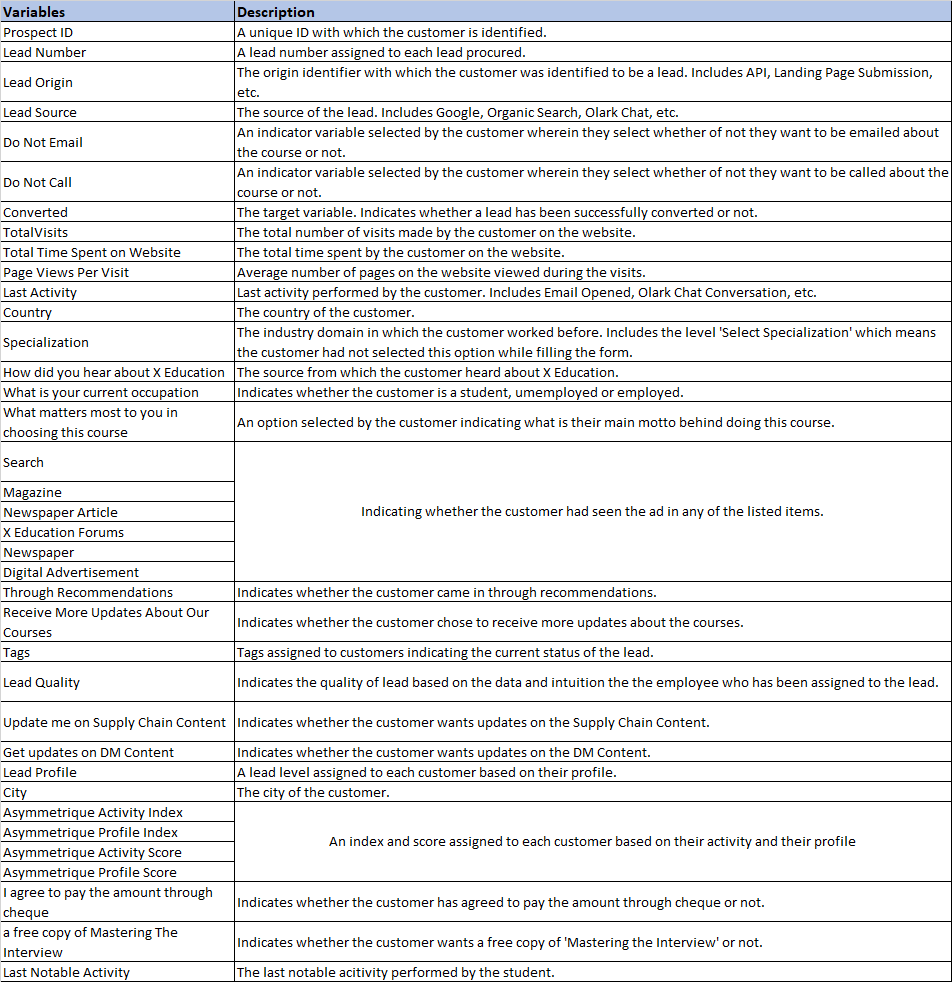



-  the columns 'Receive More Updates About our courses' and 'Do Not Email' or 'Do Not Call' seems to be redundant

- The columns 'Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'News Papers', 'Digital Advertisement' does not seem to be relevant to the current problem i.e. to find promising leads from overall leads. These might be of interest in case of a problem related to marketing campaigns

- Target column is 'converted'

- we need to find the factors that contribute towards identifying the promising leads. Interpretability is of importance to explain the salient features to business.

In [1]:
### Importing the libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

In [2]:
warnings.filterwarnings(action='ignore')
%matplotlib inline

### Loading the dataset

- All data quality checks are performed, and all data quality issues are addressed in the right way (missing value imputation, removing duplicate data and other kinds of data redundancies, etc.). Explanations for data quality issues are clearly mentioned in comments or in the presentation.

- Dummy variables are created properly wherever applicable.

 
- New metrics are derived if applicable and are used for analysis and modelling.

     
- The data is converted to a clean format suitable for analysis in Python.

In [3]:
data=pd.read_csv('Leads.csv')

In [4]:
data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,...,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,...,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,...,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,...,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,...,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [5]:
## check for duplicate data

data.duplicated().sum()

0

In [6]:
#dataframe information

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 37 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Prospect ID                                    9240 non-null   object 
 1   Lead Number                                    9240 non-null   int64  
 2   Lead Origin                                    9240 non-null   object 
 3   Lead Source                                    9204 non-null   object 
 4   Do Not Email                                   9240 non-null   object 
 5   Do Not Call                                    9240 non-null   object 
 6   Converted                                      9240 non-null   int64  
 7   TotalVisits                                    9103 non-null   float64
 8   Total Time Spent on Website                    9240 non-null   int64  
 9   Page Views Per Visit                           9103 

- There are total of 37 columns and 9240 rows
- From the info , we see that there are columns with missing values
- There is missing data for Lead Quanlity and Lead Profile which are assigned by the employees based the lead profile and intuition

In [7]:
#### dropping the columns 

data.drop(['Search', 'Magazine', 'Newspaper Article', 'X Education Forums', 'Newspaper', 'Digital Advertisement'],axis=1,inplace=True) 

In [8]:
data.shape

(9240, 31)

In [9]:
pd.set_option('display.max_columns',50)
data.head()

,Prospect ID,Lead Number,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,How did you hear about X Education,What is your current occupation,What matters most to you in choosing a course,Through Recommendations,Receive More Updates About Our Courses,Tags,Lead Quality,Update me on Supply Chain Content,Get updates on DM Content,Lead Profile,City,Asymmetrique Activity Index,Asymmetrique Profile Index,Asymmetrique Activity Score,Asymmetrique Profile Score,I agree to pay the amount through cheque,A free copy of Mastering The Interview,Last Notable Activity
0,7927b2df-8bba-4d29-b9a2-b6e0beafe620,660737,API,Olark Chat,No,No,0,0.0,0,0.0,Page Visited on Website,NaN,Select,Select,Unemployed,Better Career Prospects,No,No,Interested in other courses,Low in Relevance,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Modified
1,2a272436-5132-4136-86fa-dcc88c88f482,660728,API,Organic Search,No,No,0,5.0,674,2.5,Email Opened,India,Select,Select,Unemployed,Better Career Prospects,No,No,Ringing,NaN,No,No,Select,Select,02.Medium,02.Medium,15.0,15.0,No,No,Email Opened
2,8cc8c611-a219-4f35-ad23-fdfd2656bd8a,660727,Landing Page Submission,Direct Traffic,No,No,1,2.0,1532,2.0,Email Opened,India,Business Administration,Select,Student,Better Career Prospects,No,No,Will revert after reading the email,Might be,No,No,Potential Lead,Mumbai,02.Medium,01.High,14.0,20.0,No,Yes,Email Opened
3,0cc2df48-7cf4-4e39-9de9-19797f9b38cc,660719,Landing Page Submission,Direct Traffic,No,No,0,1.0,305,1.0,Unreachable,India,Media and Advertising,Word Of Mouth,Unemployed,Better Career Prospects,No,No,Ringing,Not Sure,No,No,Select,Mumbai,02.Medium,01.High,13.0,17.0,No,No,Modified
4,3256f628-e534-4826-9d63-4a8b88782852,660681,Landing Page Submission,Google,No,No,1,2.0,1428,1.0,Converted to Lead,India,Select,Other,Unemployed,Better Career Prospects,No,No,Will revert after reading the email,Might be,No,No,Select,Mumbai,02.Medium,01.High,15.0,18.0,No,No,Modified


In [10]:
### dropping columns 'Prospect ID' and 'Lead Number' are these are ID values and are of no significance

data.drop(['Prospect ID', 'Lead Number'],axis=1, inplace=True)

### Conversion ratio

In [11]:
data['Converted'].value_counts()[1] / data.shape[0]

0.3853896103896104

In [12]:
data['Converted'].value_counts()

Converted
0    5679
1    3561
Name: count, dtype: int64

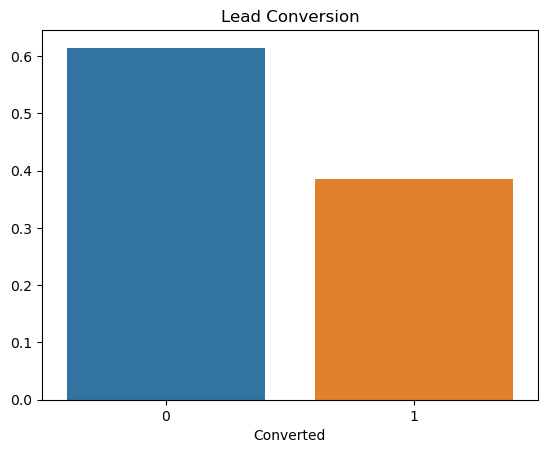

In [13]:
sns.barplot(x=data['Converted'].value_counts(normalize=True).index, y = data['Converted'].value_counts(normalize=True).values)
plt.title('Lead Conversion')
plt.show()

The data set is not so biased as we see fairly good sample containing 38% of lead conversion

### Data Understanding

In [14]:
#categorical columns : 

categorical_columns = data.select_dtypes(include='object').columns.to_list()
categorical_columns

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Do Not Call',
 'Last Activity',
 'Country',
 'Specialization',
 'How did you hear about X Education',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Through Recommendations',
 'Receive More Updates About Our Courses',
 'Tags',
 'Lead Quality',
 'Update me on Supply Chain Content',
 'Get updates on DM Content',
 'Lead Profile',
 'City',
 'Asymmetrique Activity Index',
 'Asymmetrique Profile Index',
 'I agree to pay the amount through cheque',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

In [15]:
for col in categorical_columns:
    #print(col)
    print(data[col].value_counts())
    print("\n")

Lead Origin
Landing Page Submission    4886
API                        3580
Lead Add Form               718
Lead Import                  55
Quick Add Form                1
Name: count, dtype: int64


Lead Source
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: count, dtype: int64


Do Not Email
No     8506
Yes     734
Name: count, dtype: int64


Do Not Call
No     9238
Yes       2
Name: count, dtype: int64


Last Activity
Email Opened                    3437
SMS Sent                        27

* What is difference between Lead Origin and Lead Source. Which is of more importance ?

In [16]:
#Looking at the data, there is no variance in columns 'Receive More Updates About Our Courses', 'I agree to pay the amount through cheque','Update me on Supply Chain Content', 'Get updates on DM Content' that can expalain the variance lead conversion.
# Hence these can be dropped

data.drop(['Receive More Updates About Our Courses', 'I agree to pay the amount through cheque','Update me on Supply Chain Content', 'Get updates on DM Content'],axis=1,inplace=True)

### Fixing Rows and Columns

In [17]:
# checking for any empty rows / columns

data.isna().all().sum()

0

.. There are no empty rows in the data set

In [18]:
# there are few columns that have 'SELECT' as cateogrical value, which can be considered as missing value as it seems user has not selected any value

select_value_cols = data.columns[data.eq('Select').any()]
select_value_cols

Index(['Specialization', 'How did you hear about X Education', 'Lead Profile',
       'City'],
      dtype='object')

In [19]:
data.replace('Select',np.NaN,inplace=True)

In [20]:
data.columns[data.eq('Select').any()] # all data with 'Select' has been replaced with NaN

Index([], dtype='object')

### Missing Values

In [21]:
# check for missing values in the columns

data.columns[data.isna().sum()>0].to_list()

['Lead Source',
 'TotalVisits',
 'Page Views Per Visit',
 'Last Activity',
 'Country',
 'Specialization',
 'How did you hear about X Education',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Tags',
 'Lead Quality',
 'Lead Profile',
 'City',
 'Asymmetrique Activity Index',
 'Asymmetrique Profile Index',
 'Asymmetrique Activity Score',
 'Asymmetrique Profile Score']

In [22]:
round((data.isna().sum()/data.shape[0]).sort_values(ascending=False)*100,2)>50

How did you hear about X Education                True
Lead Profile                                      True
Lead Quality                                      True
Asymmetrique Profile Score                       False
Asymmetrique Activity Score                      False
Asymmetrique Profile Index                       False
Asymmetrique Activity Index                      False
City                                             False
Specialization                                   False
Tags                                             False
What matters most to you in choosing a course    False
What is your current occupation                  False
Country                                          False
Page Views Per Visit                             False
TotalVisits                                      False
Last Activity                                    False
Lead Source                                      False
A free copy of Mastering The Interview           False
Lead Origi

In [23]:
#droppin columns with more the 50% missing values

del_list=data.columns[round((data.isna().sum()/data.shape[0])*100,2)>50].to_list()
del_list


['How did you hear about X Education', 'Lead Quality', 'Lead Profile']

In [24]:
data.drop(del_list,axis=1,inplace=True)

In [25]:
round((data.isna().sum()/data.shape[0]).sort_values(ascending=False)*100,2)

Asymmetrique Profile Score                       45.65
Asymmetrique Activity Score                      45.65
Asymmetrique Profile Index                       45.65
Asymmetrique Activity Index                      45.65
City                                             39.71
Specialization                                   36.58
Tags                                             36.29
What matters most to you in choosing a course    29.32
What is your current occupation                  29.11
Country                                          26.63
TotalVisits                                       1.48
Page Views Per Visit                              1.48
Last Activity                                     1.11
Lead Source                                       0.39
A free copy of Mastering The Interview            0.00
Lead Origin                                       0.00
Through Recommendations                           0.00
Total Time Spent on Website                       0.00
Converted 

In [26]:
# deleting assymetric scoring as it has around 45% missing values

data.drop(['Asymmetrique Activity Index',
 'Asymmetrique Profile Index',
 'Asymmetrique Activity Score',
 'Asymmetrique Profile Score'], axis=1, inplace=True)

In [27]:
### Checking the data 

cat_columns = data.select_dtypes(include='object')

for col in cat_columns:
    #print(col)
    print(data[col].value_counts())
    print("\n")

Lead Origin
Landing Page Submission    4886
API                        3580
Lead Add Form               718
Lead Import                  55
Quick Add Form                1
Name: count, dtype: int64


Lead Source
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: count, dtype: int64


Do Not Email
No     8506
Yes     734
Name: count, dtype: int64


Do Not Call
No     9238
Yes       2
Name: count, dtype: int64


Last Activity
Email Opened                    3437
SMS Sent                        27

In [28]:
data[data['Do Not Call']=='Yes']

,Lead Origin,Lead Source,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
619,API,Google,No,Yes,1,9.0,1482,3.0,Email Opened,India,Marketing Management,Unemployed,Better Career Prospects,No,Will revert after reading the email,Mumbai,No,Modified
4335,Lead Add Form,Reference,No,Yes,1,0.0,0,0.0,Olark Chat Conversation,NaN,Healthcare Management,Unemployed,Better Career Prospects,No,Closed by Horizzon,Mumbai,No,Modified


In [29]:
# The 'Do Not Call' does not explain any variation in the lead conversion. Hence deleting the same

data.drop('Do Not Call',axis=1, inplace=True)

In [30]:
## Statistical information

data.describe(percentiles=[0.5,.95,.98,.99,.9995], include='all')

,Lead Origin,Lead Source,Do Not Email,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Last Activity,Country,Specialization,What is your current occupation,What matters most to you in choosing a course,Through Recommendations,Tags,City,A free copy of Mastering The Interview,Last Notable Activity
count,9240,9204,9240,9240.000000,9103.000000,9240.000000,9103.000000,9137,6779,5860,6550,6531,9240,5887,5571,9240,9240
unique,5,21,2,NaN,NaN,NaN,NaN,17,38,18,6,3,2,26,6,2,16
top,Landing Page Submission,Google,No,NaN,NaN,NaN,NaN,Email Opened,India,Finance Management,Unemployed,Better Career Prospects,No,Will revert after reading the email,Mumbai,No,Modified
freq,4886,2868,8506,NaN,NaN,NaN,NaN,3437,6492,976,5600,6528,9233,2072,3222,6352,3407
mean,NaN,NaN,NaN,0.385390,3.445238,487.698268,2.362820,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,0.486714,4.854853,548.021466,2.161418,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,0.000000,3.000000,248.000000,2.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
95%,NaN,NaN,NaN,1.000000,10.000000,1562.000000,6.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98%,NaN,NaN,NaN,1.000000,13.000000,1734.000000,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [31]:
data[data['Page Views Per Visit']>15].shape #outlier data

(5, 17)

In [32]:
data[data['TotalVisits']>30].shape #outlier data

(10, 17)

In [33]:
data[data['Total Time Spent on Website']>2100].shape

(12, 17)

### Handling Missing Values

In [34]:
data.isna().sum()

Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Last Activity                                     103
Country                                          2461
Specialization                                   3380
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Through Recommendations                             0
Tags                                             3353
City                                             3669
A free copy of Mastering The Interview              0
Last Notable Activity                               0
dtype: int64

#### What is the difference between 'Last Activity' and 'Last Notable Activity'





In [35]:
data['Last Activity'].value_counts()

Last Activity
Email Opened                    3437
SMS Sent                        2745
Olark Chat Conversation          973
Page Visited on Website          640
Converted to Lead                428
Email Bounced                    326
Email Link Clicked               267
Form Submitted on Website        116
Unreachable                       93
Unsubscribed                      61
Had a Phone Conversation          30
Approached upfront                 9
View in browser link Clicked       6
Email Received                     2
Email Marked Spam                  2
Visited Booth in Tradeshow         1
Resubscribed to emails             1
Name: count, dtype: int64

In [36]:
data['Last Notable Activity'].value_counts()

Last Notable Activity
Modified                        3407
Email Opened                    2827
SMS Sent                        2172
Page Visited on Website          318
Olark Chat Conversation          183
Email Link Clicked               173
Email Bounced                     60
Unsubscribed                      47
Unreachable                       32
Had a Phone Conversation          14
Email Marked Spam                  2
Approached upfront                 1
Resubscribed to emails             1
View in browser link Clicked       1
Form Submitted on Website          1
Email Received                     1
Name: count, dtype: int64

- The Last Notable Activity values are same as Last Activity, expect for 'Modified'. But since Last Activity has missing values, we shall consider 'Last Notable Activity' for further analysis

- Hence dropping 'Last Activity' which seems to be redundant

In [37]:
data[data['Last Activity'].isna()]['Last Notable Activity'].value_counts()

Last Notable Activity
Modified    103
Name: count, dtype: int64

- Cannot interpolate the Last Activity values from Last Notable Activity as all are 'Modified' (can be any activity)

In [38]:
data[data['Last Activity'].isna()]['Converted'].value_counts()

Converted
1    81
0    22
Name: count, dtype: int64

In [39]:
data.drop('Last Activity',axis=1, inplace=True)

In [40]:
data['Last Notable Activity'].isna().sum()

0

In [41]:
data['Last Notable Activity'].value_counts()

Last Notable Activity
Modified                        3407
Email Opened                    2827
SMS Sent                        2172
Page Visited on Website          318
Olark Chat Conversation          183
Email Link Clicked               173
Email Bounced                     60
Unsubscribed                      47
Unreachable                       32
Had a Phone Conversation          14
Email Marked Spam                  2
Approached upfront                 1
Resubscribed to emails             1
View in browser link Clicked       1
Form Submitted on Website          1
Email Received                     1
Name: count, dtype: int64

### missing value treatement for Country

In [42]:
data['Country'].isna().sum()/data.shape[0]

0.2663419913419913

In [43]:
data[data['Country'].isna()]["City"].value_counts()

City
Mumbai                         211
Thane & Outskirts               80
Other Cities                    55
Other Cities of Maharashtra     43
Other Metro Cities              15
Tier II Cities                   2
Name: count, dtype: int64

In [44]:
data[data['Country'].isna()]["City"].value_counts().values.sum()

406

In [45]:
data[data['Country'].isna()]["City"].isna().sum()

2055

- Country and City both are null

In [46]:
data[data['City'].isna()]["Country"].isna().sum()

2055

In [47]:
data['City'].isna().sum()

3669

In [48]:
data[data['City'].isna()]["Country"].value_counts().values.sum()

1614

In [49]:
data[data['City'].isna()]["Country"].isna().sum()

2055

- We cannot impute the mode / mean for the 29% of the missing data in Country and City
- Further there are data incosistencies between Country and City. Which one to be considered as correct value ?

In [50]:
data['Country'].replace(np.NaN,'Missing',inplace=True)

In [51]:
data['Country'].value_counts()

Country
India                   6492
Missing                 2461
United States             69
United Arab Emirates      53
Singapore                 24
Saudi Arabia              21
United Kingdom            15
Australia                 13
Qatar                     10
Bahrain                    7
Hong Kong                  7
Oman                       6
France                     6
unknown                    5
Kuwait                     4
South Africa               4
Canada                     4
Nigeria                    4
Germany                    4
Sweden                     3
Philippines                2
Uganda                     2
Italy                      2
Bangladesh                 2
Netherlands                2
Asia/Pacific Region        2
China                      2
Belgium                    2
Ghana                      2
Kenya                      1
Sri Lanka                  1
Tanzania                   1
Malaysia                   1
Liberia                    1
Switze

In [52]:
data[data['Country']=='Missing']['City'].value_counts()

City
Mumbai                         211
Thane & Outskirts               80
Other Cities                    55
Other Cities of Maharashtra     43
Other Metro Cities              15
Tier II Cities                   2
Name: count, dtype: int64

In [53]:
# Country and City has almost 30% missing data and also there are data inconsistencies. 
# Better to drop these columns

data.drop(['Country','City'],axis=1,inplace=True)

In [54]:
data.shape

(9240, 14)

In [55]:
data.isna().sum()

Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Specialization                                   3380
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Through Recommendations                             0
Tags                                             3353
A free copy of Mastering The Interview              0
Last Notable Activity                               0
dtype: int64

In [56]:
data['Tags'].value_counts().sum()

5887

In [57]:
data['Tags'].isna().sum()

3353

In [58]:
data['Tags'].mode()

0    Will revert after reading the email
Name: Tags, dtype: object

In [59]:
data['Tags'].replace(np.NaN,'Missing',inplace=True)

In [60]:
data.isna().sum()

Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Specialization                                   3380
What is your current occupation                  2690
What matters most to you in choosing a course    2709
Through Recommendations                             0
Tags                                                0
A free copy of Mastering The Interview              0
Last Notable Activity                               0
dtype: int64

In [61]:
data['What matters most to you in choosing a course'].value_counts()

What matters most to you in choosing a course
Better Career Prospects      6528
Flexibility & Convenience       2
Other                           1
Name: count, dtype: int64

In [62]:
data.groupby(by='What matters most to you in choosing a course')['Converted'].sum()

What matters most to you in choosing a course
Better Career Prospects      3190
Flexibility & Convenience       1
Other                           0
Name: Converted, dtype: int64

In [63]:
data[data['What matters most to you in choosing a course'].isna()]['Converted'].value_counts()

Converted
0    2339
1     370
Name: count, dtype: int64

In [64]:
## assigning missing values as 'Other'

data['What matters most to you in choosing a course'].replace(np.NaN,'Other',inplace=True)

In [65]:
data.isna().sum()

Lead Origin                                         0
Lead Source                                        36
Do Not Email                                        0
Converted                                           0
TotalVisits                                       137
Total Time Spent on Website                         0
Page Views Per Visit                              137
Specialization                                   3380
What is your current occupation                  2690
What matters most to you in choosing a course       0
Through Recommendations                             0
Tags                                                0
A free copy of Mastering The Interview              0
Last Notable Activity                               0
dtype: int64

In [66]:
data['What is your current occupation'].value_counts()

What is your current occupation
Unemployed              5600
Working Professional     706
Student                  210
Other                     16
Housewife                 10
Businessman                8
Name: count, dtype: int64

In [67]:
data.groupby(by='What is your current occupation')['Converted'].sum()

What is your current occupation
Businessman                5
Housewife                 10
Other                     10
Student                   78
Unemployed              2441
Working Professional     647
Name: Converted, dtype: int64

In [68]:
data[data['What is your current occupation'].isna()]['Converted'].value_counts()

Converted
0    2320
1     370
Name: count, dtype: int64

In [69]:
data[data['What is your current occupation'].isna()]['Specialization'].value_counts()

Specialization
Finance Management                   214
Human Resource Management            172
Marketing Management                 160
Operations Management                108
Business Administration               89
IT Projects Management                88
Supply Chain Management               71
Banking, Investment And Insurance     69
Travel and Tourism                    53
Media and Advertising                 41
International Business                40
Healthcare Management                 34
E-COMMERCE                            31
Retail Management                     22
Hospitality Management                21
Services Excellence                   15
Rural and Agribusiness                15
E-Business                            14
Name: count, dtype: int64

In [70]:
data[data['What is your current occupation']=='Student']['Specialization'].value_counts()

Specialization
Finance Management                   24
Human Resource Management            19
Marketing Management                 18
Banking, Investment And Insurance    14
Healthcare Management                 7
Business Administration               6
IT Projects Management                6
Operations Management                 5
Supply Chain Management               5
Hospitality Management                4
Rural and Agribusiness                4
International Business                4
Travel and Tourism                    4
Retail Management                     2
E-COMMERCE                            1
E-Business                            1
Media and Advertising                 1
Name: count, dtype: int64

In [71]:
data['Specialization'].value_counts()

Specialization
Finance Management                   976
Human Resource Management            848
Marketing Management                 838
Operations Management                503
Business Administration              403
IT Projects Management               366
Supply Chain Management              349
Banking, Investment And Insurance    338
Travel and Tourism                   203
Media and Advertising                203
International Business               178
Healthcare Management                159
Hospitality Management               114
E-COMMERCE                           112
Retail Management                    100
Rural and Agribusiness                73
E-Business                            57
Services Excellence                   40
Name: count, dtype: int64

In [72]:
data[data['Specialization'].isna()]['What is your current occupation'].value_counts()

What is your current occupation
Unemployed              1828
Student                   85
Working Professional      31
Businessman                2
Other                      1
Name: count, dtype: int64

In [73]:
data[data['Specialization'].isna()]['Converted'].value_counts()

Converted
0    2411
1     969
Name: count, dtype: int64

In [74]:
data.groupby(by='Specialization')['Converted'].sum()

Specialization
Banking, Investment And Insurance    167
Business Administration              179
E-Business                            21
E-COMMERCE                            40
Finance Management                   436
Healthcare Management                 79
Hospitality Management                48
Human Resource Management            388
IT Projects Management               140
International Business                64
Marketing Management                 408
Media and Advertising                 85
Operations Management                238
Retail Management                     34
Rural and Agribusiness                31
Services Excellence                   11
Supply Chain Management              151
Travel and Tourism                    72
Name: Converted, dtype: int64

In [75]:
data['Specialization'].value_counts()

Specialization
Finance Management                   976
Human Resource Management            848
Marketing Management                 838
Operations Management                503
Business Administration              403
IT Projects Management               366
Supply Chain Management              349
Banking, Investment And Insurance    338
Travel and Tourism                   203
Media and Advertising                203
International Business               178
Healthcare Management                159
Hospitality Management               114
E-COMMERCE                           112
Retail Management                    100
Rural and Agribusiness                73
E-Business                            57
Services Excellence                   40
Name: count, dtype: int64

In [76]:
data['Specialization'].isna().sum()

3380

In [77]:
data['What is your current occupation'].isna().sum()

2690

In [78]:
data['Specialization'].replace(np.NaN,'Missing',inplace=True)

In [79]:
data['What is your current occupation'].replace(np.NaN,'Missing',inplace=True)

In [80]:
data.isna().sum()

Lead Origin                                        0
Lead Source                                       36
Do Not Email                                       0
Converted                                          0
TotalVisits                                      137
Total Time Spent on Website                        0
Page Views Per Visit                             137
Specialization                                     0
What is your current occupation                    0
What matters most to you in choosing a course      0
Through Recommendations                            0
Tags                                               0
A free copy of Mastering The Interview             0
Last Notable Activity                              0
dtype: int64

In [81]:
data['TotalVisits'].value_counts()

TotalVisits
0.0      2189
2.0      1680
3.0      1306
4.0      1120
5.0       783
6.0       466
1.0       395
7.0       309
8.0       224
9.0       164
10.0      114
11.0       86
13.0       48
12.0       45
14.0       36
16.0       21
15.0       18
17.0       16
18.0       15
20.0       12
19.0        9
21.0        6
23.0        6
24.0        5
25.0        5
27.0        5
22.0        3
29.0        2
28.0        2
26.0        2
141.0       1
55.0        1
30.0        1
43.0        1
74.0        1
41.0        1
54.0        1
115.0       1
251.0       1
32.0        1
42.0        1
Name: count, dtype: int64

<Axes: >

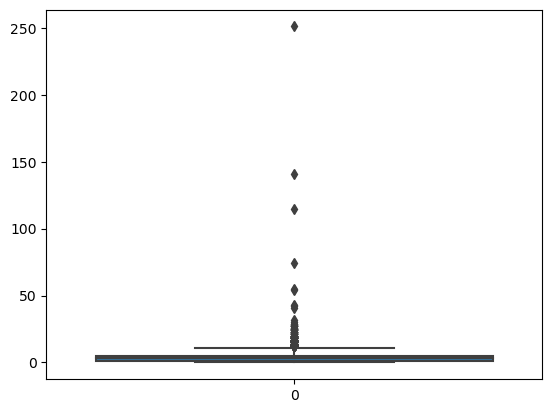

In [82]:
sns.boxplot(data['TotalVisits'])

In [83]:
#outliers exists, let replace the value by median

data['TotalVisits'].replace(np.NaN,data['TotalVisits'].median,inplace=True)

In [84]:
data1=pd.read_csv('Leads.csv')

In [85]:
data['TotalVisits']=data1['TotalVisits']

In [86]:
med=data['TotalVisits'].median()

In [87]:
data['TotalVisits'].replace(np.NaN,med,inplace=True)

In [88]:
data.isna().sum()

Lead Origin                                        0
Lead Source                                       36
Do Not Email                                       0
Converted                                          0
TotalVisits                                        0
Total Time Spent on Website                        0
Page Views Per Visit                             137
Specialization                                     0
What is your current occupation                    0
What matters most to you in choosing a course      0
Through Recommendations                            0
Tags                                               0
A free copy of Mastering The Interview             0
Last Notable Activity                              0
dtype: int64

In [89]:
data['Page Views Per Visit'].value_counts()

Page Views Per Visit
0.00    2189
2.00    1795
3.00    1196
4.00     896
1.00     651
        ... 
3.43       1
2.56       1
6.33       1
1.64       1
2.08       1
Name: count, Length: 114, dtype: int64

<Axes: >

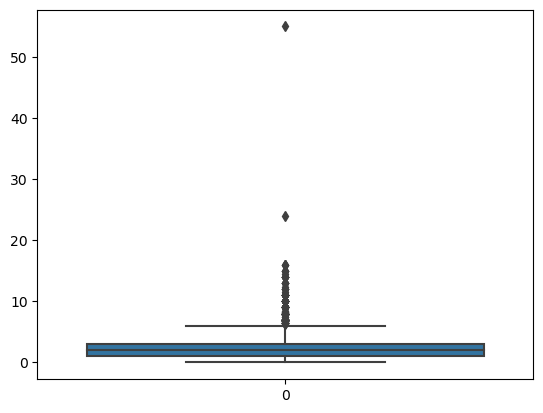

In [90]:
sns.boxplot(data['Page Views Per Visit'])

In [91]:
#outliers exists, lets replace missing values with median

data['Page Views Per Visit'].replace(np.NaN,data['Page Views Per Visit'].median(),inplace=True)

In [92]:
data.isna().sum()

Lead Origin                                       0
Lead Source                                      36
Do Not Email                                      0
Converted                                         0
TotalVisits                                       0
Total Time Spent on Website                       0
Page Views Per Visit                              0
Specialization                                    0
What is your current occupation                   0
What matters most to you in choosing a course     0
Through Recommendations                           0
Tags                                              0
A free copy of Mastering The Interview            0
Last Notable Activity                             0
dtype: int64

In [93]:
data['Lead Source'].value_counts()

Lead Source
Google               2868
Direct Traffic       2543
Olark Chat           1755
Organic Search       1154
Reference             534
Welingak Website      142
Referral Sites        125
Facebook               55
bing                    6
google                  5
Click2call              4
Press_Release           2
Social Media            2
Live Chat               2
youtubechannel          1
testone                 1
Pay per Click Ads       1
welearnblog_Home        1
WeLearn                 1
blog                    1
NC_EDM                  1
Name: count, dtype: int64

In [94]:
#replacing with mode value

data['Lead Source'].replace(np.NaN,data['Lead Source'].mode()[0],inplace=True)

In [95]:
data.isna().sum()

Lead Origin                                      0
Lead Source                                      0
Do Not Email                                     0
Converted                                        0
TotalVisits                                      0
Total Time Spent on Website                      0
Page Views Per Visit                             0
Specialization                                   0
What is your current occupation                  0
What matters most to you in choosing a course    0
Through Recommendations                          0
Tags                                             0
A free copy of Mastering The Interview           0
Last Notable Activity                            0
dtype: int64

### Detecting outliers

In [96]:
numerical_cols = data._get_numeric_data().columns.to_list()
numerical_cols

['Converted',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit']

In [97]:
numerical_cols=['TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit']

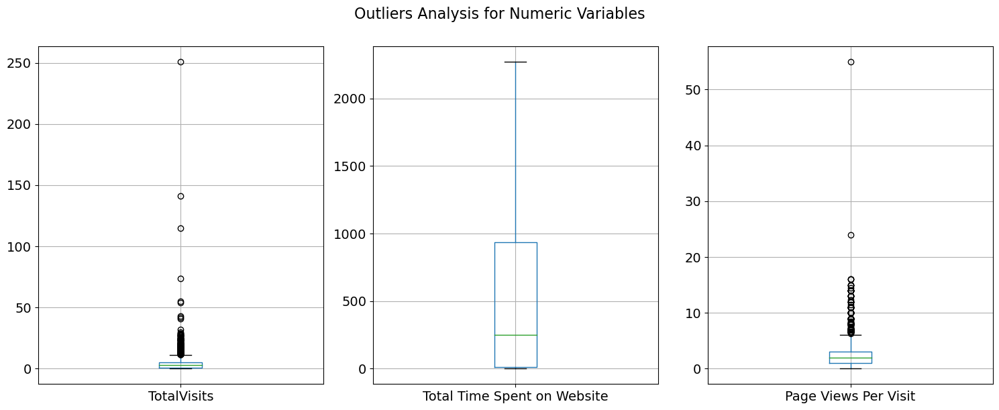

In [98]:
plt.figure(figsize=(15,6))
i=1
for column in numerical_cols:
    plt.subplot(1,3,i)
    data.boxplot([column],fontsize=14)
    i=i+1
    
plt.suptitle('Outliers Analysis for Numeric Variables',fontsize=16, va='baseline')
plt.tight_layout()
plt.show()

In [99]:
#No outliers for Total Time Spent
# Visible outlier for Total Vists and Page Views per Visit

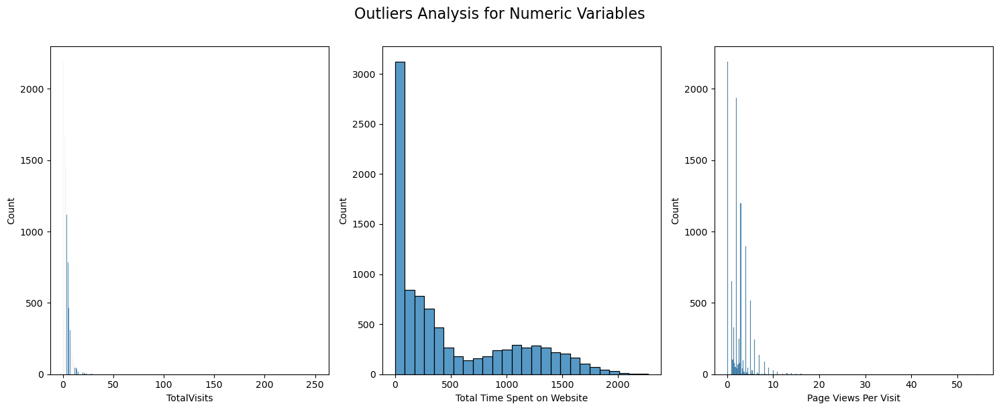

In [100]:
plt.figure(figsize=(15,6))
i=1
for column in numerical_cols:
    plt.subplot(1,3,i)
    sns.histplot(data[column])
    i=i+1
    
plt.suptitle('Outliers Analysis for Numeric Variables',fontsize=16, va='baseline')
plt.tight_layout()
plt.show()

- there is skewness in the data pertaining to 'Total Time Spent on Website'. We may try the binning method

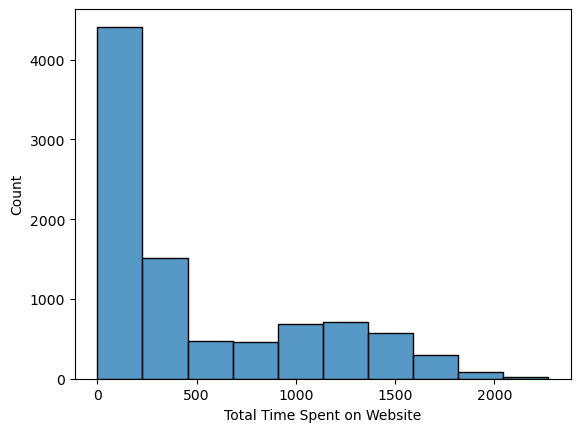

In [101]:
sns.histplot(data['Total Time Spent on Website'],bins=10)
plt.show()

In [102]:
data[numerical_cols].describe(percentiles=[0.25,0.5,0.75,0.9,0.95,0.99,0.995,0.999,0.9995])

,TotalVisits,Total Time Spent on Website,Page Views Per Visit
count,9240.000000,9240.000000,9240.000000
mean,3.438636,487.698268,2.357440
std,4.819024,548.021466,2.145781
min,0.000000,0.000000,0.000000
25%,1.000000,12.000000,1.000000
50%,3.000000,248.000000,2.000000
75%,5.000000,936.000000,3.000000
90%,7.000000,1380.000000,5.000000
95%,10.000000,1562.000000,6.000000
99%,17.000000,1840.610000,9.000000


- there is sudden increase of value above 99.95% for both Total Visits and Page Views per Visit

In [103]:
data[data['TotalVisits']>30]['Converted'].value_counts()

Converted
0    9
1    1
Name: count, dtype: int64

In [104]:
data[data['Page Views Per Visit']>15]['Converted'].value_counts()

Converted
0    4
1    1
Name: count, dtype: int64

##### Removing the rows that are above identified threshold values as outlier treatment

In [105]:
data=data[~(data['TotalVisits']>30)]

In [106]:
data=data[~(data['Page Views Per Visit']>15)]

In [107]:
data.shape

(9226, 14)

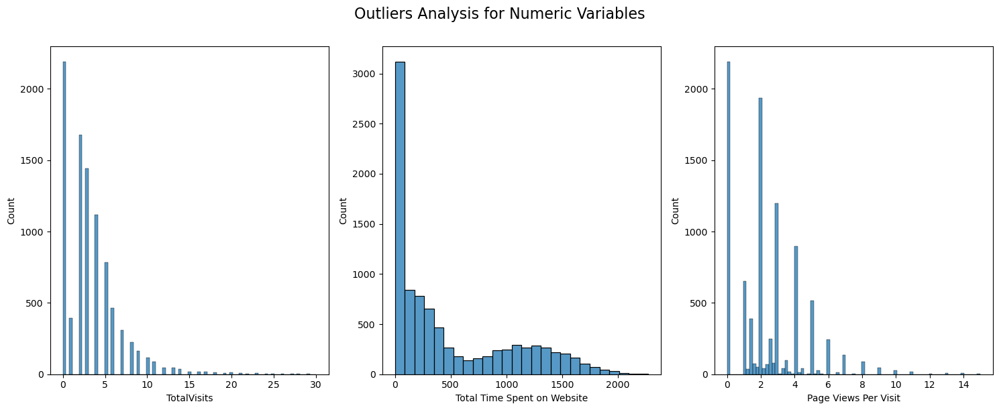

In [108]:
plt.figure(figsize=(15,6))
i=1
for column in numerical_cols:
    plt.subplot(1,3,i)
    sns.histplot(data[column])
    i=i+1
    
plt.suptitle('Outliers Analysis for Numeric Variables',fontsize=16, va='baseline')
plt.tight_layout()
plt.show()

In [109]:
data[data['Total Time Spent on Website']==0]['Converted'].value_counts()

Converted
0    1277
1     916
Name: count, dtype: int64

In [110]:
data[data['TotalVisits']==0]['Converted'].value_counts()

Converted
0    1273
1     916
Name: count, dtype: int64

In [111]:
data[data['Page Views Per Visit']==0]['Converted'].value_counts()

Converted
0    1273
1     916
Name: count, dtype: int64

? Do we need bin the values of continuous features ??

## Univariate Analysis

In [112]:
data.columns.to_list()

['Lead Origin',
 'Lead Source',
 'Do Not Email',
 'Converted',
 'TotalVisits',
 'Total Time Spent on Website',
 'Page Views Per Visit',
 'Specialization',
 'What is your current occupation',
 'What matters most to you in choosing a course',
 'Through Recommendations',
 'Tags',
 'A free copy of Mastering The Interview',
 'Last Notable Activity']

In [113]:
def categorical_analysis(col):
    plt.figure(figsize=[12,4])
    plt.subplot(1,2,1)
    ax1=sns.barplot(y=data[col].value_counts(normalize=True).index,x=data[col].value_counts(normalize=True).values)
    ax1.tick_params(axis='x', top=True, bottom=True)
    plt.xlabel('Percent Count')
    plt.ylabel('')
    plt.title(f'{col} distribution')
        
    plt.subplot(1,2,2)
    aggregated_data = data.groupby([col, 'Converted']).size().reset_index(name='count')
    total_counts = aggregated_data.groupby('Converted')['count'].transform('sum')
    aggregated_data['percentage'] = (aggregated_data['count'] / total_counts) * 100
    ax2=sns.barplot(y=col, x='percentage', hue='Converted', data=aggregated_data,order = data[col].value_counts(normalize=True).index)
    ax2.tick_params(axis='x', top=True, bottom=True)
    plt.title(f'{col} vs Converted')
    plt.xlabel('Percentage converted')
    plt.ylabel('')
    plt.tight_layout()
    plt.show()

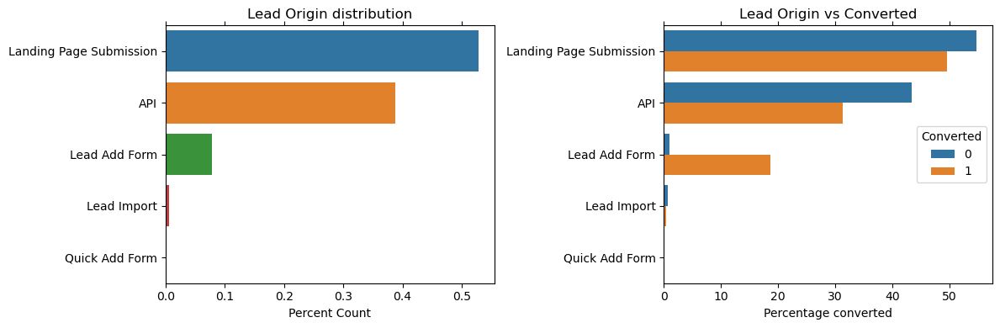

In [114]:
categorical_analysis('Lead Origin')

<span style="color:blue">**Inference from Lead Origin**</span> 
1. 'Landing Page Submission' contributes highest pertage of leads followed by 'API'. 'Lead Import' and 'Quick Add Form' has negligible contribution
2. Even though Lead Add Form has negligible overall contribution (10%), it significantly contributes to the Lead Conversion (20%)
3. 'Landing Page Submission' has almost similar contirbution of non-conversion and conversion of leads
4. 'API' had high non-converted leads compared to converted leads

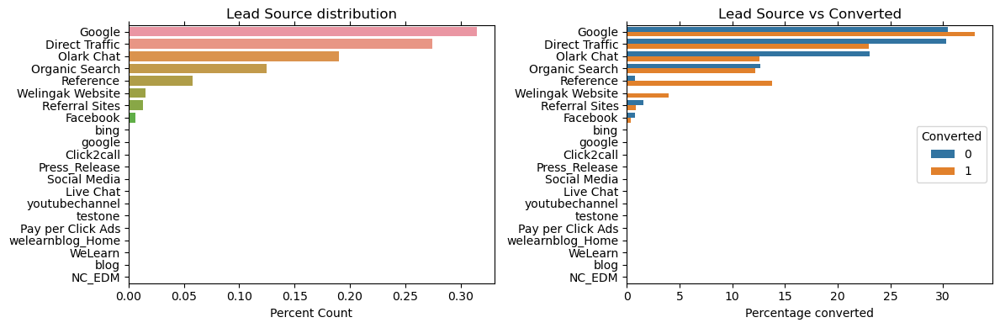

In [115]:
categorical_analysis('Lead Source')

<span style="color:blue">**Inference from Lead Source**</span> 
1. The top contributors for lead source as 'Google (32%), Direct Traffic (28%), Olark Chat (18%), Organic Seracg (12%) and Reference (6%)
2. Even though Reference contributes to only 6% of overall Lead SOurce, it contributes to 15% of Lead Conversion. The sales team can follow up more on References to have better conversion rate
3. 'Google' has similar share of converted and non-converted leads and is maximum contribution towards percentage converted
4. Direct Traffic and 'Olark Chat' has more percentage of non-converted leads

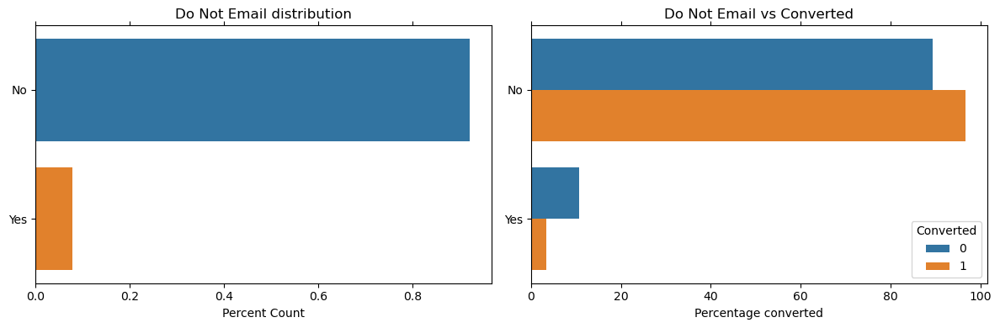

In [116]:
categorical_analysis('Do Not Email')

<span style="color:blue">**Inference from Do Not Email**</span> 

1.The percentage contribution to lead conversion for the leads opting 'Do Not Email' is bery less

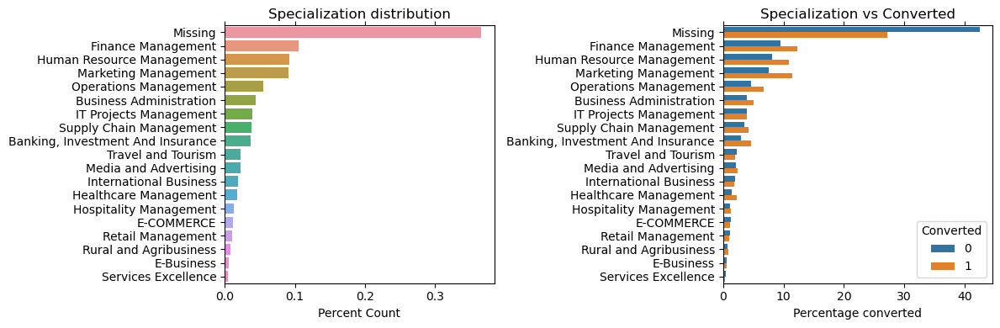

In [117]:
categorical_analysis('Specialization')

<span style="color:blue">**Inference from Specialization**</span> 
1. The Specialiazation of approx 40% leads is unknown (i.e. Missing), but at the same time contributes to over 25% of lead conversion
2. Finance MAnagement, Human Resource Management, Marketing Management, Operations Management have good lead conversion

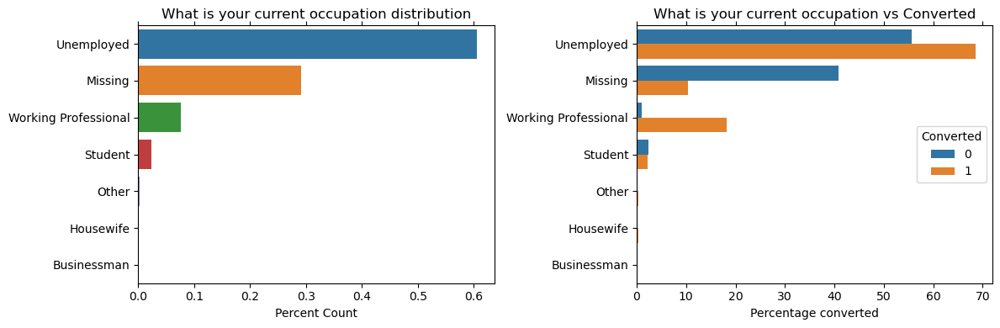

In [118]:
categorical_analysis('What is your current occupation')

<span style="color:blue">**Inference from Current Occupation**</span> 
1. The maximum percentage of leads are from Unemployed and have major contribution to lead conversion
2. The business can follow up with Work Professionals which have high lead conversion

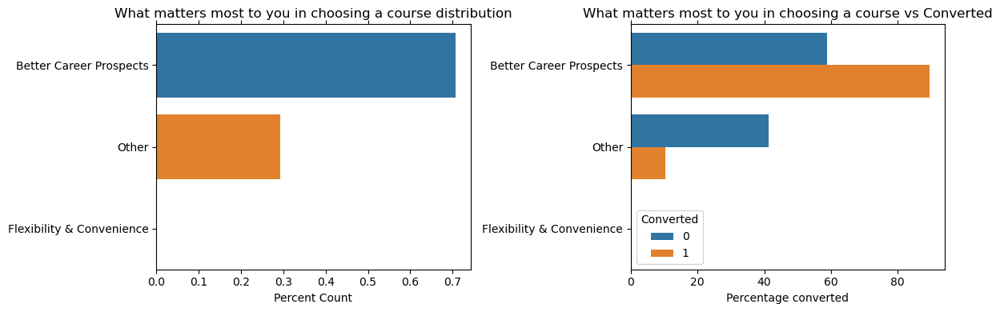

In [119]:
categorical_analysis('What matters most to you in choosing a course')

<span style="color:blue">**Inference from reason for course selection**</span> 

1. The business can follow up with leads who has appraoched looking for 'Better Career Prospects', as that contributes to 90% of lead conversion

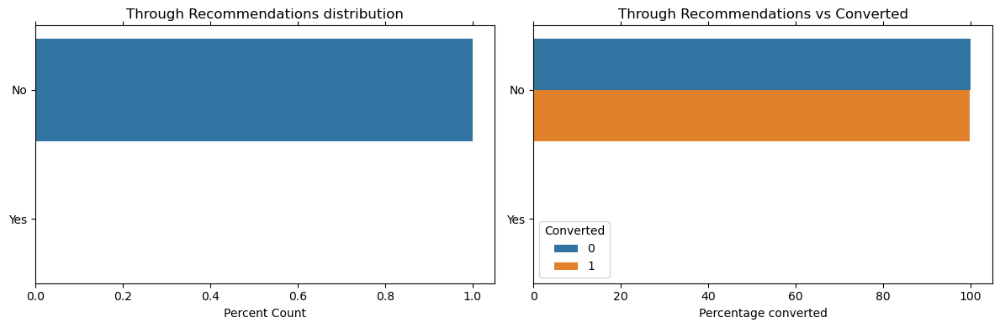

In [120]:
categorical_analysis('Through Recommendations')

In [121]:
data['Through Recommendations'].value_counts()

Through Recommendations
No     9219
Yes       7
Name: count, dtype: int64

In [122]:
data.groupby('Through Recommendations')['Converted'].sum()

Through Recommendations
No     3554
Yes       5
Name: Converted, dtype: int64

<span style="color:blue">**Inference from Through Recommendation**</span> 

1. Even though the number of leads through recommendation is very minimal like (0.1%). It is good to follow up on these recommendation as they have tendency to convert (as per the little data we have)

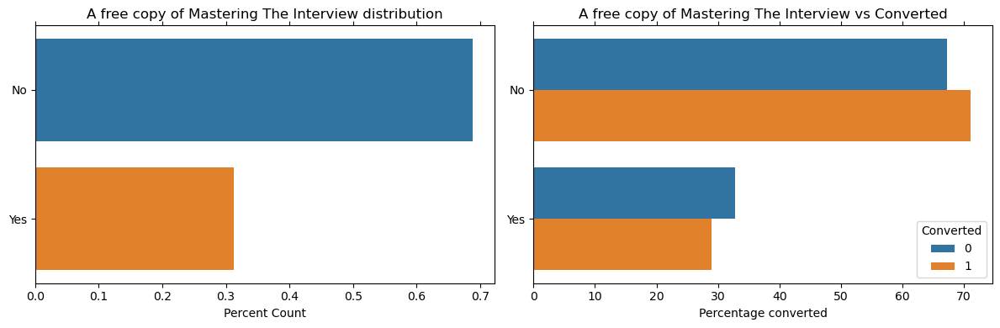

In [123]:
categorical_analysis('A free copy of Mastering The Interview')

<span style="color:blue">**Inference from A free copy of Mastering The Interview **</span> 
1. It has equal distribution of non-converted and converted leads. This may not be a significant feature is predicting the lead conversion

In [124]:
def categorical_analysis_resize(col):
    plt.figure(figsize=[20,10])
    plt.subplot(1,2,1)
    ax1=sns.barplot(y=data[col].value_counts(normalize=True).index,x=data[col].value_counts(normalize=True).values)
    plt.xticks(fontsize=14)
    ax1.tick_params(axis='x', top=True, bottom=True)
    plt.xlabel('Percent Count')
    plt.ylabel('')
    plt.title(f'{col} distribution')
        
    plt.subplot(1,2,2)
    aggregated_data = data.groupby([col, 'Converted']).size().reset_index(name='count')
    total_counts = aggregated_data.groupby('Converted')['count'].transform('sum')
    aggregated_data['percentage'] = (aggregated_data['count'] / total_counts) * 100
    ax2=sns.barplot(y=col, x='percentage', hue='Converted', data=aggregated_data,order = data[col].value_counts(normalize=True).index)
    ax2.tick_params(axis='x', top=True, bottom=True)
    plt.title(f'{col} vs Converted')
    plt.xlabel('Percentage converted')
    plt.ylabel('')
    plt.tight_layout()
    plt.show()

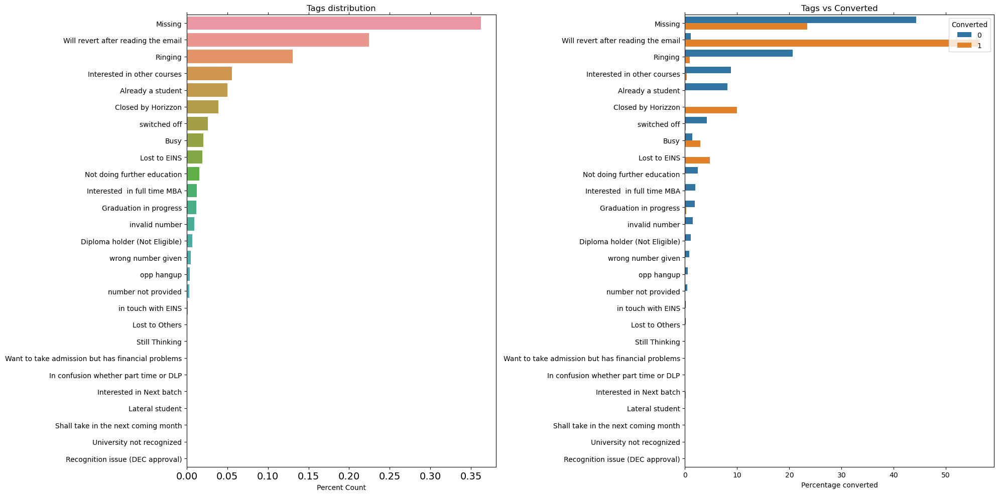

In [125]:
categorical_analysis_resize('Tags')

<span style="color:blue">**Inference from Tags**</span> 

1. The leads with tags 'Will revert after reading the mail' has high lead conversion rate of 60%
2. Significatn high lead conversion is observed for leads for whom tags were missing

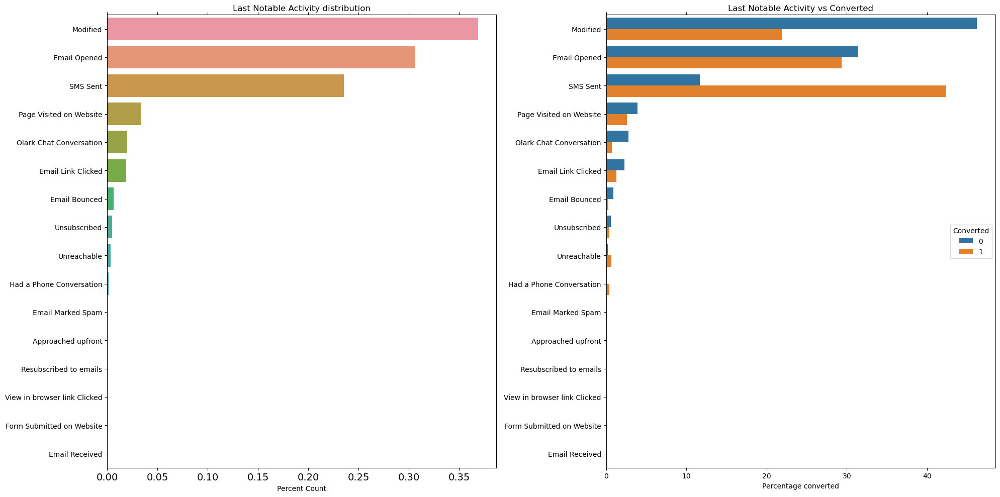

In [126]:
categorical_analysis_resize('Last Notable Activity')

<span style="color:blue">**Inference from Last Notable Activity**</span> 

1. The leads with Last Notable Activity as 'SMS Sent' and 'Email Opened' has high lead conversion rate, followed by 'Modified'


### Numerical Column Analysis

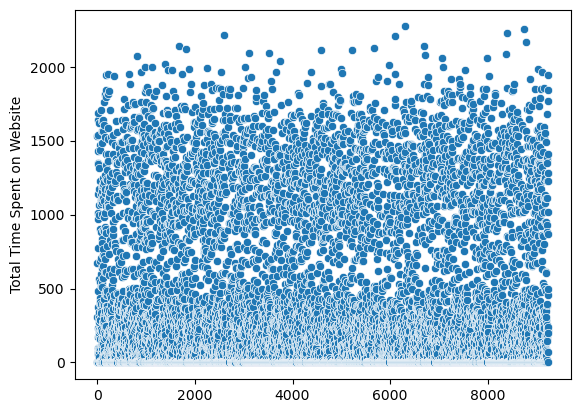

In [127]:
sns.scatterplot(data['Total Time Spent on Website'])
plt.show()

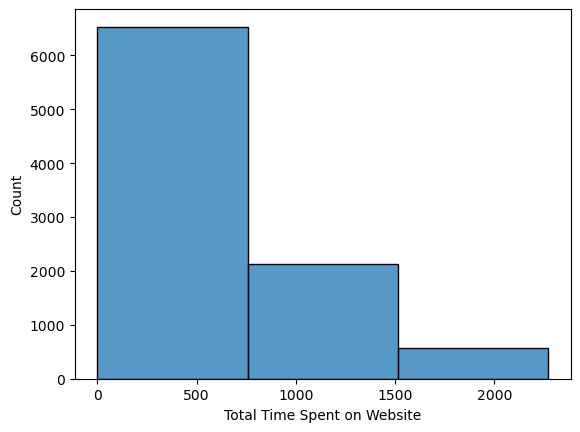

In [128]:
sns.histplot(data['Total Time Spent on Website'],bins=3)
plt.show()

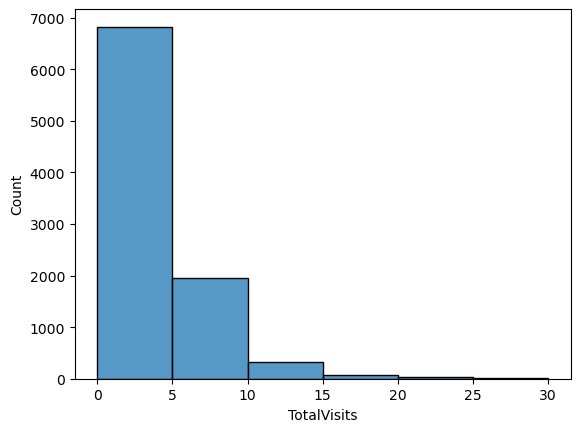

In [129]:
sns.histplot(data['TotalVisits'],bins=6)
plt.show()

<Axes: xlabel='Converted', ylabel='TotalVisits'>

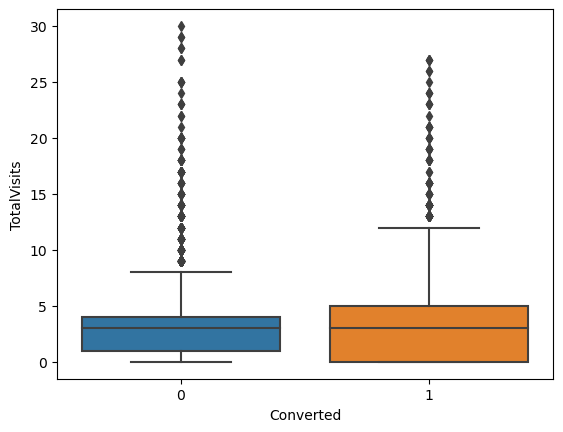

In [130]:
sns.boxplot(x=data['Converted'], y = data['TotalVisits'])
plt.show()

<Axes: xlabel='Converted', ylabel='Total Time Spent on Website'>

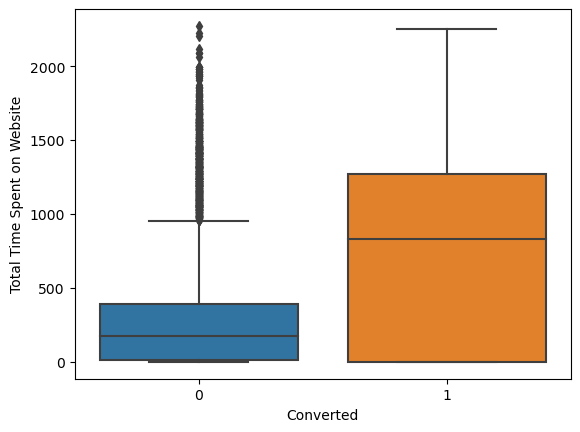

In [131]:
sns.boxplot(x=data['Converted'], y = data['Total Time Spent on Website'])

<Axes: xlabel='Converted', ylabel='Page Views Per Visit'>

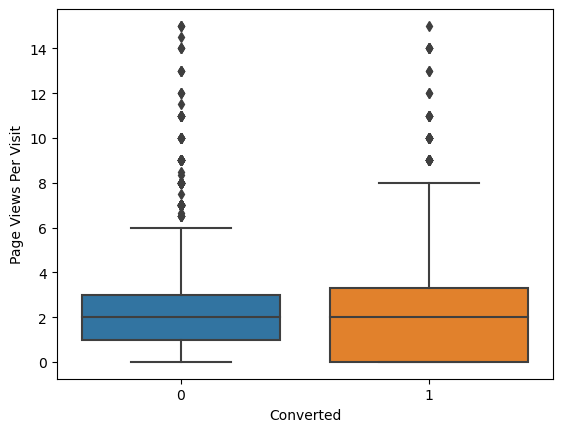

In [132]:
sns.boxplot(x=data['Converted'], y = data['Page Views Per Visit'])

### Bi-Variate Analysis

<Axes: xlabel='TotalVisits', ylabel='Page Views Per Visit'>

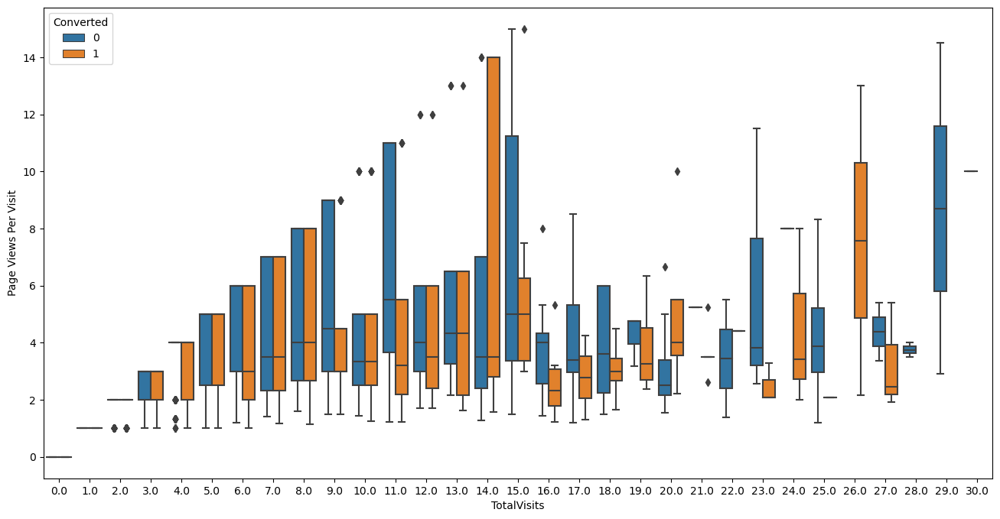

In [133]:
plt.figure(figsize=(16,8))
sns.boxplot(x=data['TotalVisits'], y = data['Page Views Per Visit'],hue=data['Converted'])

<Axes: xlabel='What is your current occupation', ylabel='TotalVisits'>

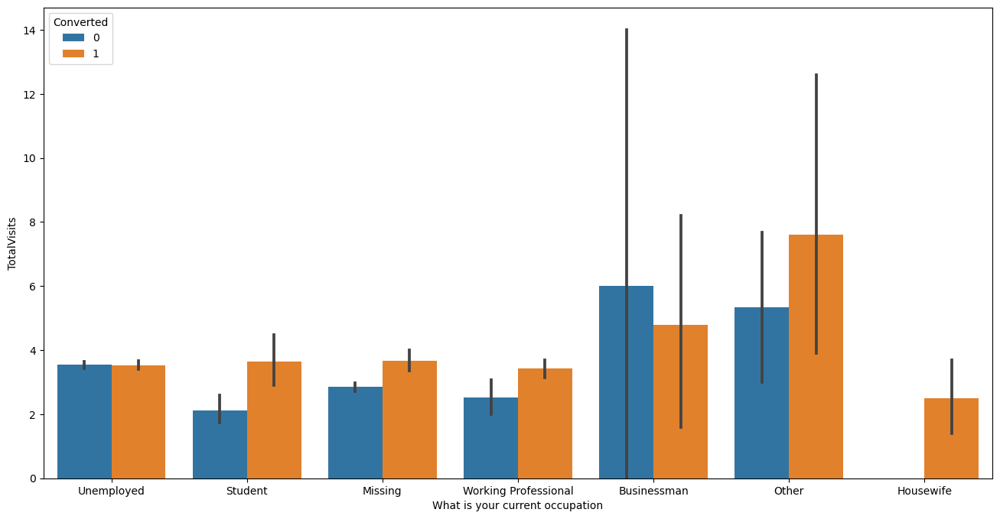

In [134]:
plt.figure(figsize=(16,8))
sns.barplot(x=data['What is your current occupation'],y=data['TotalVisits'],hue=data['Converted'])

<Axes: xlabel='What is your current occupation', ylabel='Total Time Spent on Website'>

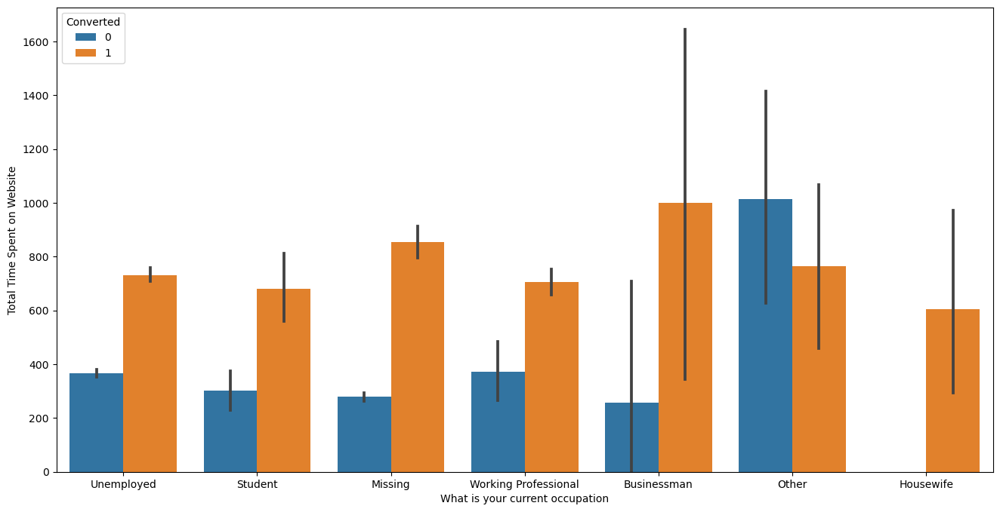

In [135]:
plt.figure(figsize=(16,8))
sns.barplot(x=data['What is your current occupation'],y=data['Total Time Spent on Website'],hue=data['Converted'])

<Axes: xlabel='What is your current occupation', ylabel='Page Views Per Visit'>

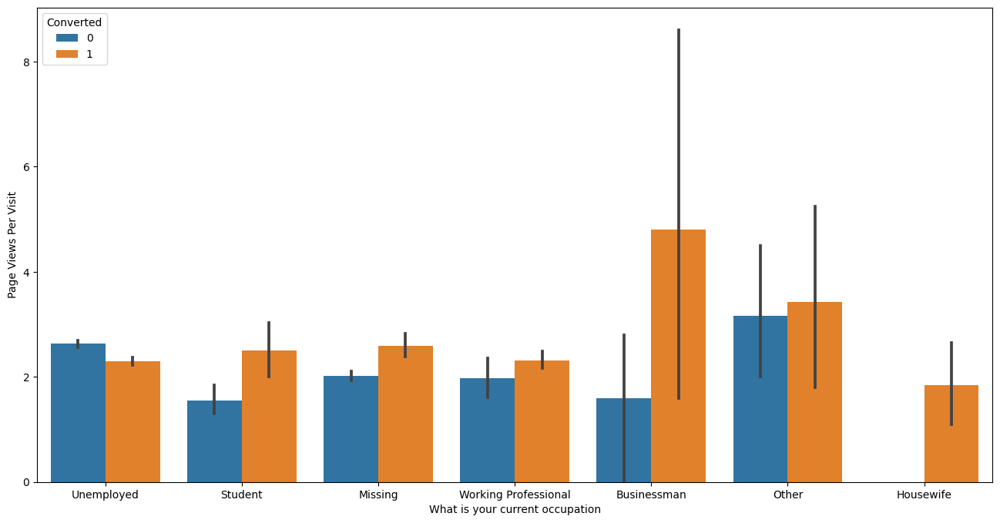

In [136]:
plt.figure(figsize=(16,8))
sns.barplot(x=data['What is your current occupation'],y=data['Page Views Per Visit'],hue=data['Converted'])

<Axes: xlabel='Specialization', ylabel='TotalVisits'>

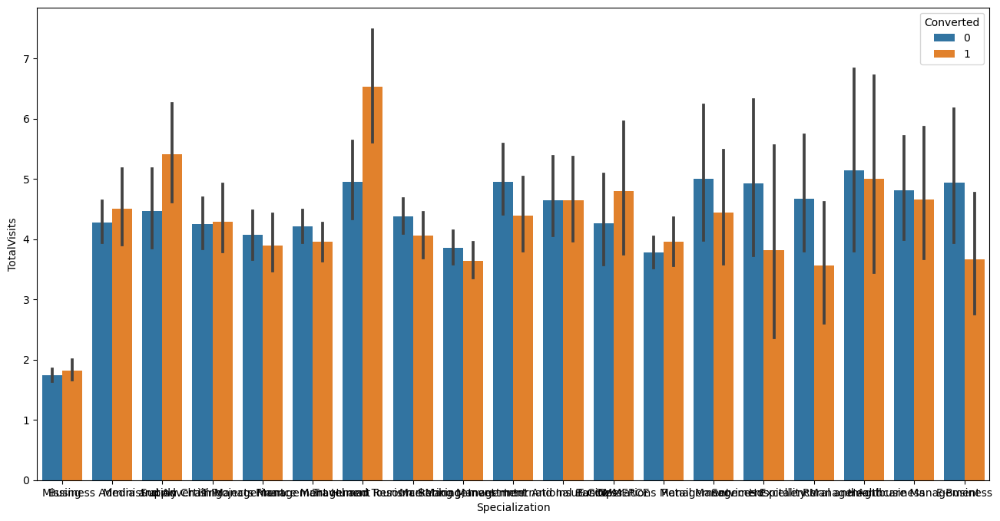

In [137]:
plt.figure(figsize=(16,8))
sns.barplot(x=data['Specialization'],y=data['TotalVisits'],hue=data['Converted'])

<Axes: xlabel='Specialization', ylabel='Total Time Spent on Website'>

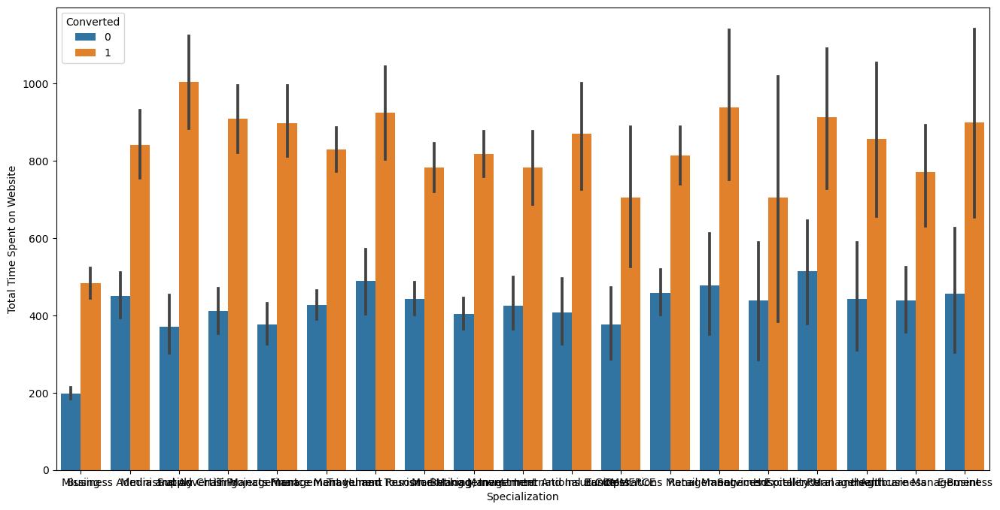

In [138]:
plt.figure(figsize=(16,8))
sns.barplot(x=data['Specialization'],y=data['Total Time Spent on Website'],hue=data['Converted'])

<Axes: xlabel='Specialization', ylabel='Page Views Per Visit'>

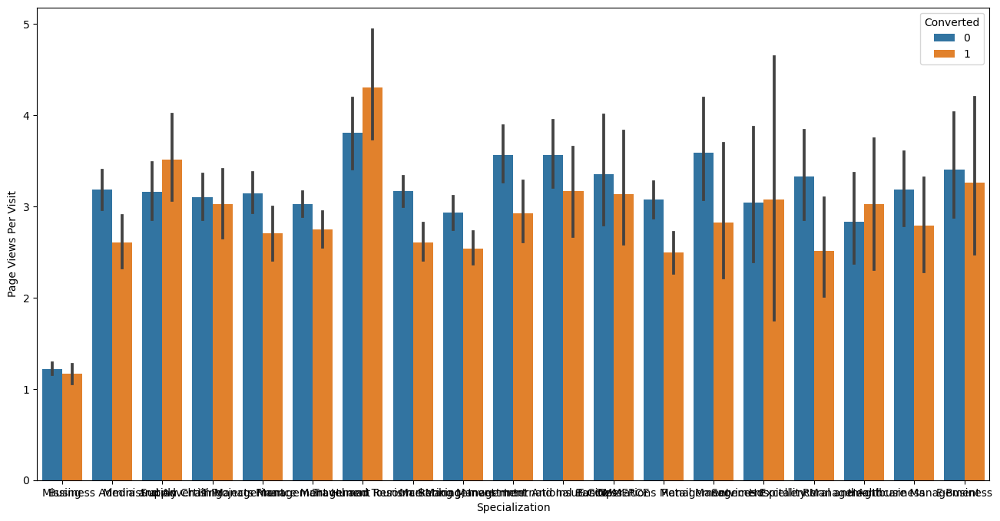

In [139]:
plt.figure(figsize=(16,8))
sns.barplot(x=data['Specialization'],y=data['Page Views Per Visit'],hue=data['Converted'])

#### Inference:

As the amount of time spent on website increased the lead has high chances of conversion. The business can focus on leads spending more time on the website


#### Numerical columns analysis

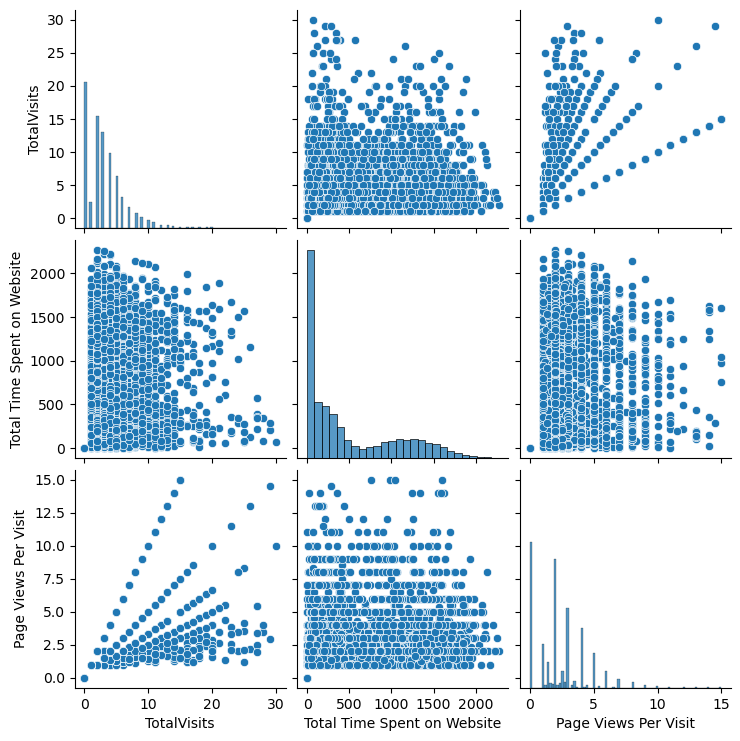

In [140]:
sns.pairplot(data[['TotalVisits','Total Time Spent on Website', 'Page Views Per Visit']])

- As the number of visits increases the number of pages per visit increase

#### Creating a new variable - Average time spent

In [141]:
### Creating a new variable - Average time spent (Total Time Spent on Website / TotalVisits)

data['Average Time Spent on Website'] = data['Total Time Spent on Website'] / data['TotalVisits']

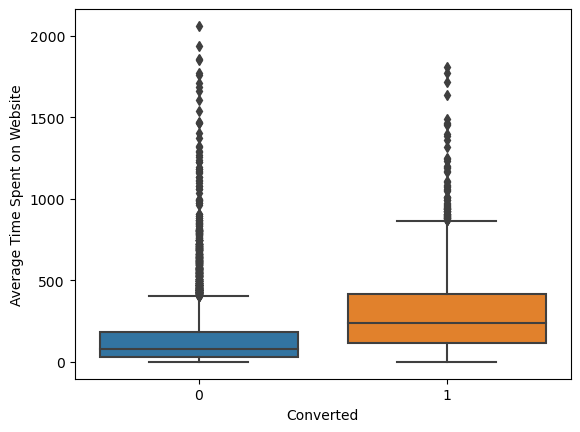

In [142]:
sns.boxplot(x=data['Converted'], y = data['Average Time Spent on Website'])
plt.show()

- As median on 'Average Time Spent on Website' is higher for the converted leads. So the business can follow up on those leads who tend to spend higher time on websites

<Axes: >

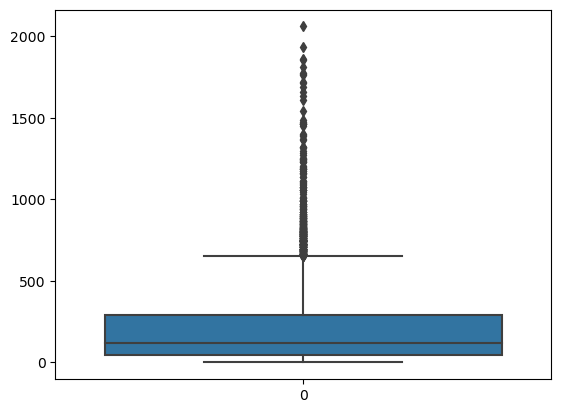

In [143]:
sns.boxplot(data['Average Time Spent on Website'])

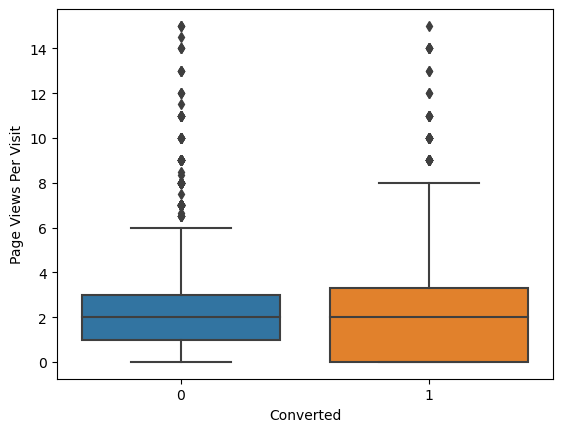

In [144]:
sns.boxplot(x=data['Converted'], y = data['Page Views Per Visit'])
plt.show()

- The average Page Views per visit distribution is identify for non-converted and converted. The converted leads seems to have visisted more number of pages per visit


In [145]:
### As we have created a new feature , deleting 'Total Time Spent on Website' and 'TotalVisits'

data.drop(['Total Time Spent on Website', 'TotalVisits'],axis=1,inplace=True)

In [146]:
data.describe(percentiles=[0,0.25,0.5,0.75,0.9,0.95,0.99,0.995,0.999])

,Converted,Page Views Per Visit,Average Time Spent on Website
count,9226.000000,9226.000000,7037.000000
mean,0.385758,2.342496,204.695108
std,0.486800,2.044900,229.992667
min,0.000000,0.000000,0.000000
0%,0.000000,0.000000,0.000000
25%,0.000000,1.000000,44.500000
50%,0.000000,2.000000,121.666667
75%,1.000000,3.000000,288.000000
90%,1.000000,5.000000,508.000000
95%,1.000000,6.000000,664.466667


In [147]:
data[data['Average Time Spent on Website']>1750]

,Lead Origin,Lead Source,Do Not Email,Converted,Page Views Per Visit,Specialization,What is your current occupation,What matters most to you in choosing a course,Through Recommendations,Tags,A free copy of Mastering The Interview,Last Notable Activity,Average Time Spent on Website
138,API,Google,Yes,0,1.0,Missing,Unemployed,Better Career Prospects,No,Missing,No,Olark Chat Conversation,1759.0
151,Landing Page Submission,Direct Traffic,No,1,1.0,IT Projects Management,Missing,Other,No,Lost to EINS,Yes,Modified,1808.0
3243,Landing Page Submission,Direct Traffic,Yes,0,1.0,Finance Management,Missing,Other,No,Missing,Yes,Modified,1771.0
3583,API,Google,No,0,1.0,Missing,Missing,Other,No,Missing,No,Modified,1852.0
5293,Lead Add Form,Reference,No,1,1.0,Healthcare Management,Unemployed,Better Career Prospects,No,Closed by Horizzon,No,Email Link Clicked,1770.0
7975,API,Google,No,0,1.0,Missing,Unemployed,Better Career Prospects,No,Missing,No,Modified,2059.0
8019,Landing Page Submission,Google,Yes,0,1.0,Retail Management,Unemployed,Better Career Prospects,No,Interested in other courses,No,Email Bounced,1936.0
9154,API,Olark Chat,No,0,1.0,Missing,Missing,Other,No,Missing,No,Modified,1858.0


<Axes: >

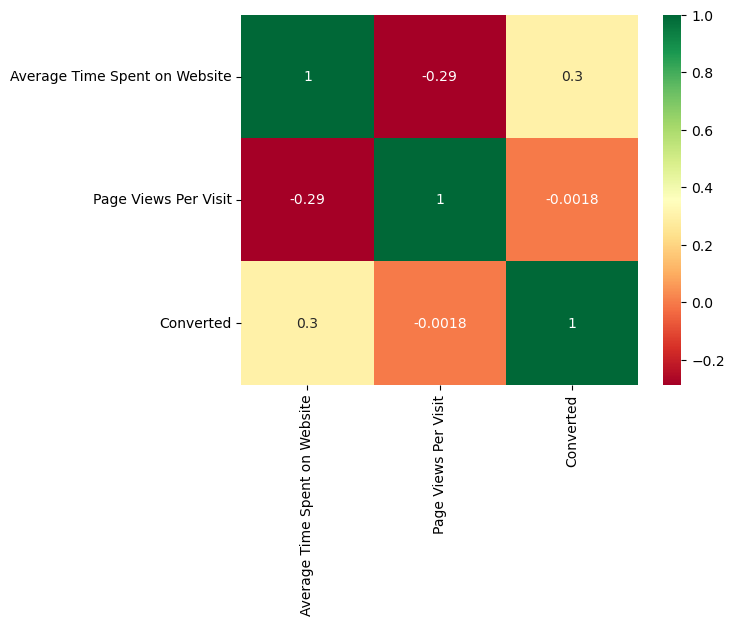

In [148]:
### plotting heatmap to check for correlation between the variables

sns.heatmap(data[['Average Time Spent on Website','Page Views Per Visit','Converted']].corr(),cmap='RdYlGn',annot=True)

In [149]:
# Average Time Spent on Website has a possitve correlation with Converted Leads
# Page Views per Vist and Average Time spend on Website has negatove correlation

#### Converting some binary variables (Yes/No) to 0/1

In [150]:
# List of variables to map

varlist =  ['Do Not Email', 'Through Recommendations', 'A free copy of Mastering The Interview']

# Defining the map function
def binary_map(x):
    return x.map({'Yes': 1, "No": 0})

# Applying the function to the housing list
data[varlist] = data[varlist].apply(binary_map)

#### For categorical variables with multiple levels, create dummy features (one-hot encoded)

In [151]:
# Creating a dummy variable for some of the categorical variables and dropping the first one.
dummy1 = pd.get_dummies(data[['Lead Origin', 'Lead Source', 'Specialization', 'What is your current occupation','What matters most to you in choosing a course','Tags','Last Notable Activity']],dtype=int, drop_first=True)

# Adding the results to the master dataframe
data = pd.concat([data, dummy1], axis=1)

In [152]:
data.head()

,Lead Origin,Lead Source,Do Not Email,Converted,Page Views Per Visit,Specialization,What is your current occupation,What matters most to you in choosing a course,Through Recommendations,Tags,A free copy of Mastering The Interview,Last Notable Activity,Average Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,...,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,API,Olark Chat,0,0,0.0,Missing,Unemployed,Better Career Prospects,0,Interested in other courses,0,Modified,NaN,0,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,API,Organic Search,0,0,2.5,Missing,Unemployed,Better Career Prospects,0,Ringing,0,Email Opened,134.8,0,0,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,Landing Page Submission,Direct Traffic,0,1,2.0,Business Administration,Student,Better Career Prospects,0,Will revert after reading the email,1,Email Opened,766.0,1,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,Landing Page Submission,Direct Traffic,0,0,1.0,Media and Advertising,Unemployed,Better Career Prospects,0,Ringing,0,Modified,305.0,1,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,Landing Page Submission,Google,0,1,1.0,Missing,Unemployed,Better Career Prospects,0,Will revert after reading the email,0,Modified,714.0,1,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


#### Dropping the repeated variables

In [153]:
data.drop(['Lead Origin', 'Lead Source', 'Specialization', 'What is your current occupation','What matters most to you in choosing a course','Tags','Last Notable Activity'],axis=1,inplace=True)

In [154]:
data.shape

(9226, 97)

In [155]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9226 entries, 0 to 9239
Data columns (total 97 columns):
 #   Column                                                                   Non-Null Count  Dtype  
---  ------                                                                   --------------  -----  
 0   Do Not Email                                                             9226 non-null   int64  
 1   Converted                                                                9226 non-null   int64  
 2   Page Views Per Visit                                                     9226 non-null   float64
 3   Through Recommendations                                                  9226 non-null   int64  
 4   A free copy of Mastering The Interview                                   9226 non-null   int64  
 5   Average Time Spent on Website                                            7037 non-null   float64
 6   Lead Origin_Landing Page Submission                                      9226

### Step 4: Test-Train Split

In [156]:
from sklearn.model_selection import train_test_split

In [157]:
# Putting response variable to y
y=data.pop('Converted')

In [158]:
y.head()

0    0
1    0
2    1
3    0
4    1
Name: Converted, dtype: int64

In [159]:
# Putting feature variable to X
X=data

In [160]:
X.head()

,Do Not Email,Page Views Per Visit,Through Recommendations,A free copy of Mastering The Interview,Average Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,...,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0,0.0,0,0,NaN,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,2.5,0,0,134.8,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0,2.0,0,1,766.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,1.0,0,0,305.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,1.0,0,0,714.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [161]:
X.isna().sum()

Do Not Email                                             0
Page Views Per Visit                                     0
Through Recommendations                                  0
A free copy of Mastering The Interview                   0
Average Time Spent on Website                         2189
                                                      ... 
Last Notable Activity_Resubscribed to emails             0
Last Notable Activity_SMS Sent                           0
Last Notable Activity_Unreachable                        0
Last Notable Activity_Unsubscribed                       0
Last Notable Activity_View in browser link Clicked       0
Length: 96, dtype: int64

In [162]:
## the 'AVerage Time Spent on Website' has NaN values due to the calculation of 0/0

data['Average Time Spent on Website']=data['Average Time Spent on Website'].fillna(0)

In [163]:
X=data

In [164]:
X.head()

,Do Not Email,Page Views Per Visit,Through Recommendations,A free copy of Mastering The Interview,Average Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,...,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,0,0.0,0,0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,0,2.5,0,0,134.8,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,0,2.0,0,1,766.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3,0,1.0,0,0,305.0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,1.0,0,0,714.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [165]:
X.shape

(9226, 96)

In [166]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.7, test_size=0.3, random_state=100)

In [167]:
X_train.shape

(6458, 96)

In [168]:
X_test.shape

(2768, 96)

In [169]:
y_train.shape

(6458,)

In [170]:
y_test.shape

(2768,)

In [171]:
X_train.describe()

,Do Not Email,Page Views Per Visit,Through Recommendations,A free copy of Mastering The Interview,Average Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,...,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
count,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.0,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.0,...,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.0,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000
mean,0.077733,2.348543,0.000929,0.305977,157.382319,0.527253,0.078043,0.005110,0.0,0.270207,0.005110,0.319604,0.000310,0.000155,0.190926,0.124497,0.000155,0.000155,0.057913,0.012852,0.000310,0.000155,0.015175,0.000774,0.0,...,0.000619,0.000155,0.000465,0.227315,0.001239,0.009291,0.003871,0.003716,0.026324,0.003716,0.006349,0.017498,0.000310,0.303809,0.000155,0.0,0.001703,0.370703,0.018736,0.032363,0.000155,0.240012,0.003561,0.004336,0.000155
std,0.267772,2.034114,0.030469,0.460856,221.241493,0.499295,0.268260,0.071307,0.0,0.444101,0.071307,0.466359,0.017597,0.012444,0.393061,0.330173,0.012444,0.012444,0.233596,0.112646,0.017597,0.012444,0.122258,0.027816,0.0,...,0.024882,0.012444,0.021550,0.419130,0.035177,0.095947,0.062103,0.060853,0.160109,0.060853,0.079432,0.131127,0.017597,0.459937,0.012444,0.0,0.041239,0.483030,0.135603,0.176976,0.012444,0.427124,0.059576,0.065708,0.012444
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,3.500000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,2.000000,0.000000,0.000000,69.083333,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,

### Step 5: Feature Scaling

In [172]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [173]:
scaler = MinMaxScaler()

X_train[['Average Time Spent on Website','Page Views Per Visit']] = scaler.fit_transform(X_train[['Average Time Spent on Website','Page Views Per Visit']])

X_train.head()

,Do Not Email,Page Views Per Visit,Through Recommendations,A free copy of Mastering The Interview,Average Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,...,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
4678,0,0.200000,0,1,0.020560,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4328,0,0.088667,0,1,0.020520,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
3650,0,0.066667,0,0,0.133560,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1051,0,0.266667,0,0,0.169257,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
8706,1,0.000000,0,0,0.000000,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0


In [174]:
X_train.describe()

,Do Not Email,Page Views Per Visit,Through Recommendations,A free copy of Mastering The Interview,Average Time Spent on Website,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Origin_Quick Add Form,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Live Chat,Lead Source_NC_EDM,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Pay per Click Ads,Lead Source_Press_Release,Lead Source_Reference,Lead Source_Referral Sites,Lead Source_Social Media,Lead Source_WeLearn,Lead Source_Welingak Website,Lead Source_bing,Lead Source_blog,...,Tags_Still Thinking,Tags_University not recognized,Tags_Want to take admission but has financial problems,Tags_Will revert after reading the email,Tags_in touch with EINS,Tags_invalid number,Tags_number not provided,Tags_opp hangup,Tags_switched off,Tags_wrong number given,Last Notable Activity_Email Bounced,Last Notable Activity_Email Link Clicked,Last Notable Activity_Email Marked Spam,Last Notable Activity_Email Opened,Last Notable Activity_Email Received,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
count,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.0,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.0,...,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.0,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000,6458.000000
mean,0.077733,0.156570,0.000929,0.305977,0.076436,0.527253,0.078043,0.005110,0.0,0.270207,0.005110,0.319604,0.000310,0.000155,0.190926,0.124497,0.000155,0.000155,0.057913,0.012852,0.000310,0.000155,0.015175,0.000774,0.0,...,0.000619,0.000155,0.000465,0.227315,0.001239,0.009291,0.003871,0.003716,0.026324,0.003716,0.006349,0.017498,0.000310,0.303809,0.000155,0.0,0.001703,0.370703,0.018736,0.032363,0.000155,0.240012,0.003561,0.004336,0.000155
std,0.267772,0.135608,0.030469,0.460856,0.107451,0.499295,0.268260,0.071307,0.0,0.444101,0.071307,0.466359,0.017597,0.012444,0.393061,0.330173,0.012444,0.012444,0.233596,0.112646,0.017597,0.012444,0.122258,0.027816,0.0,...,0.024882,0.012444,0.021550,0.419130,0.035177,0.095947,0.062103,0.060853,0.160109,0.060853,0.079432,0.131127,0.017597,0.459937,0.012444,0.0,0.041239,0.483030,0.135603,0.176976,0.012444,0.427124,0.059576,0.065708,0.012444
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.066667,0.000000,0.000000,0.001700,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.133333,0.000000,0.000000,0.033552,1.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000

In [175]:
#checking for conversion rate

y.sum()/y.shape[0]

0.3857576414480815

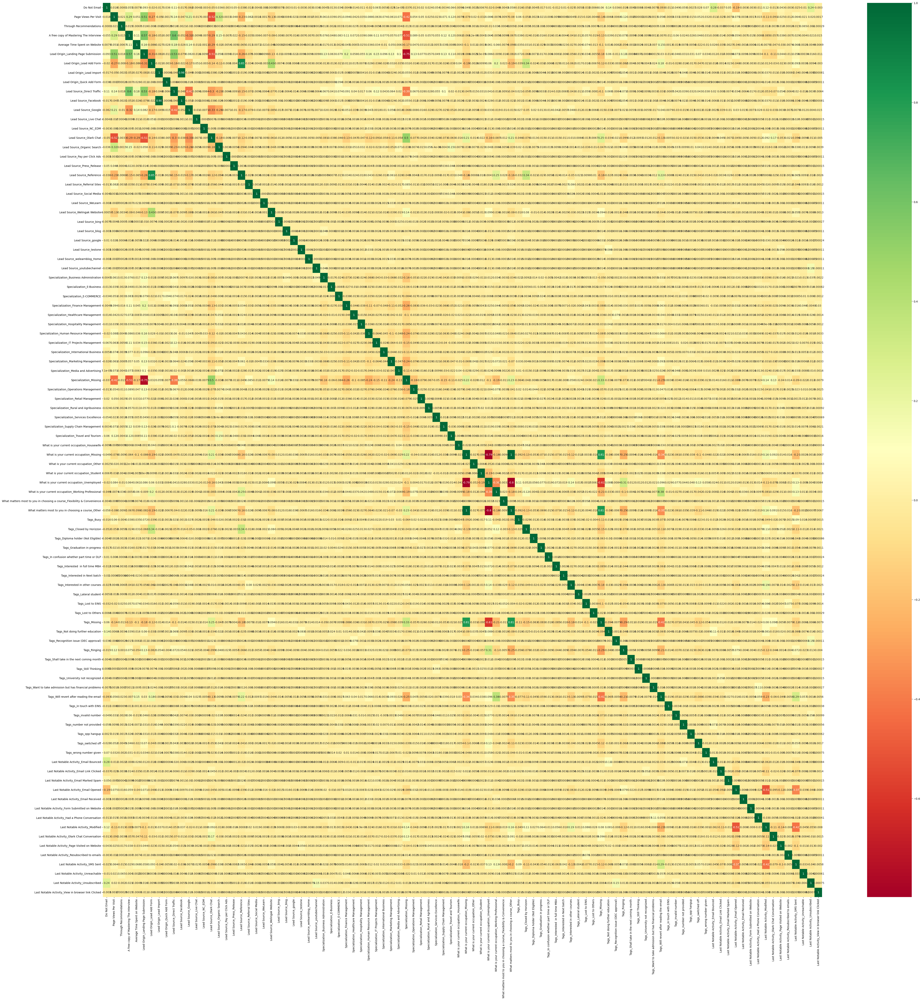

In [176]:
### Step 6: Looking at Correlations in the leads data set

plt.figure(figsize = (60,60))        # Size of the figure
sns.heatmap(data.corr(),cmap='RdYlGn',annot = True)
plt.show()

In [177]:
#Tags_Missing has high correlation (0.81) with 
# 'What is your current occupation_Missing' has high negative correlation with What is your current occupation_Unemployed

In [178]:
cor=data.corr()

In [179]:
cor1 = cor[((cor>0.3) & (cor<1)) | (cor<-0.3)]

In [180]:
cor1.dropna(axis=1,how='all',inplace=True)

In [181]:
cor1

,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Welingak Website,Specialization_Missing,What is your current occupation_Missing,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Other,Tags_Closed by Horizzon,Tags_Missing,Tags_Ringing,Tags_Will revert after reading the email,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_SMS Sent
Do Not Email,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Page Views Per Visit,NaN,NaN,0.505810,NaN,NaN,NaN,NaN,NaN,-0.520096,0.320398,NaN,NaN,-0.422641,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Through Recommendations,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A free copy of Mastering The Interview,NaN,NaN,0.569928,NaN,NaN,0.599207,NaN,-0.316188,NaN,NaN,NaN,NaN,-0.508999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Average Time Spent on Website,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Last Notable Activity_Resubscribed to emails,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Last Notable Activity_SMS Sent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.368525,-0.423874,NaN
Last Notable Activity_Unreachable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Last Notable Activity_Unsubscribed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [182]:
cor_columns=cor1.columns.to_list()

In [183]:
data[cor_columns].corr()

,Page Views Per Visit,A free copy of Mastering The Interview,Lead Origin_Landing Page Submission,Lead Origin_Lead Add Form,Lead Origin_Lead Import,Lead Source_Direct Traffic,Lead Source_Facebook,Lead Source_Google,Lead Source_Olark Chat,Lead Source_Organic Search,Lead Source_Reference,Lead Source_Welingak Website,Specialization_Missing,What is your current occupation_Missing,What is your current occupation_Unemployed,What is your current occupation_Working Professional,What matters most to you in choosing a course_Other,Tags_Closed by Horizzon,Tags_Missing,Tags_Ringing,Tags_Will revert after reading the email,Last Notable Activity_Email Opened,Last Notable Activity_Modified,Last Notable Activity_SMS Sent
Page Views Per Visit,1.000000,0.287507,0.505810,-0.271711,-0.050155,0.137849,-0.047401,0.212958,-0.520096,0.320398,-0.227321,-0.125899,-0.422641,-0.078296,0.084415,-0.007404,-0.079939,-0.053076,-0.137045,0.124798,0.056319,0.075413,-0.108584,0.063511
A free copy of Mastering The Interview,0.287507,1.000000,0.569928,-0.181011,-0.052209,0.599207,-0.052209,-0.316188,-0.293390,0.148292,-0.152082,-0.080492,-0.508999,-0.063696,0.064407,-0.005819,-0.066615,-0.024060,-0.127917,0.075056,-0.006989,0.058968,-0.085198,0.028992
Lead Origin_Landing Page Submission,0.505810,0.569928,1.000000,-0.307497,-0.081972,0.527997,-0.079151,0.082108,-0.513029,0.058278,-0.262364,-0.132342,-0.748735,-0.086157,0.085854,-0.009025,-0.081703,-0.067644,-0.175237,0.133693,0.029741,0.070792,-0.101753,0.057763
Lead Origin_Lead Add Form,-0.271711,-0.181011,-0.307497,1.000000,-0.022497,-0.178810,-0.022497,-0.167163,-0.138737,-0.109786,0.853222,0.430385,0.032278,-0.186073,0.060292,0.196424,-0.187003,0.335491,-0.115512,-0.082451,0.183001,-0.048150,-0.013148,0.092562
Lead Origin_Lead Import,-0.050155,-0.052209,-0.081972,-0.022497,1.000000,-0.047667,0.981709,-0.049427,-0.037534,-0.029266,-0.019195,-0.009682,0.055213,-0.021702,0.030730,-0.011699,-0.022008,-0.015560,-0.014455,0.053641,-0.004562,0.012705,0.037140,-0.039640
Lead Source_Direct Traffic,0.137849,0.599207,0.527997,-0.178810,-0.047667,1.000000,-0.047667,-0.416962,-0.298327,-0.232617,-0.152565,-0.076957,-0.386710,-0.047299,0.041496,-0.012774,-0.039850,-0.057038,-0.102446,0.072435,-0.031022,0.033601,-0.053089,0.019737
Lead Source_Facebook,-0.047401,-0.052209,-0.079151,-0.022497,0.981709,-0.047667,1.000000,-0.052460,-0.037534,-0.029266,-0.019195,-0.009682,0.055213,-0.021702,0.027848,-0.011699,-0.022008,-0.015560,-0.014455,0.053641,-0.004562,0.009650,0.037140,-0.036320
Lead Source_Google,0.212958,-0.316188,0.082108,-0.167163,-0.049427,-0.416962,-0.052460,1.000000,-0.328323,-0.256006,-0.167905,-0.084695,-0.065565,-0.012459,0.032993,-0.019379,-0.015498,-0.050290,-0.015462,0.021213,0.040421,0.029581,-0.020211,0.007771
Lead Source_Olark Chat,-0.520096,-0.293390,-0.513029,-0.138737,-0.037534,-0.298327,-0.037534,-0.328323,1.000000,-0.183167,-0.120132,-0.060598,0.499542,0.213693,-0.155844,-0.086536,0.211058,-0.075932,0.249272,-0.099104,-0.131128,-0.045166,0.091620,-0.096337
Lead Source_Organic Search,0.320398,0.148292,0.058278,-0.109786,-0.029266,-0.232617,-0.029266,-0.256006,-0.183167,1.000000,-0.093672,-0.047250,-0.037878,-0.037835,0.043034,-0.006450,-0.039467,-0.023320,-0.046986,0.048335,0.009469,-0.005012,-0.018366,0.037617


In [184]:
#Tags_Missing has high correlation coeff (0.81) and (0.80) with What matters most to you in choosing a course_Other and What is your current occupation_Missing
# What is your current occupation_Missing has high negative correaltion (0.79) with What is your current occupation_Unemployed and high correlation of 0.99 with What matters most to you in choosing a course_Other
# Specialization_Missing has high negavitve correlation with Landing Page Submission (-0.74)
# What matters most to you in choosing a course_Other has negative correlation with What is your current occupation_Unemployed


#### Dropping highly correlated dummy variables

In [185]:
#Dropping the above identified highly correlated columns
X_train.drop(['Tags_Missing','What is your current occupation_Missing','Specialization_Missing','What matters most to you in choosing a course_Other'],axis=1,inplace=True)


In [186]:
#Dropping the above identified highly correlated columns
X_test.drop(['Tags_Missing','What is your current occupation_Missing','Specialization_Missing','What matters most to you in choosing a course_Other'],axis=1,inplace=True)


#### Checking the Correlation Matrix

After dropping highly correlated variables now let's check the correlation matrix again.

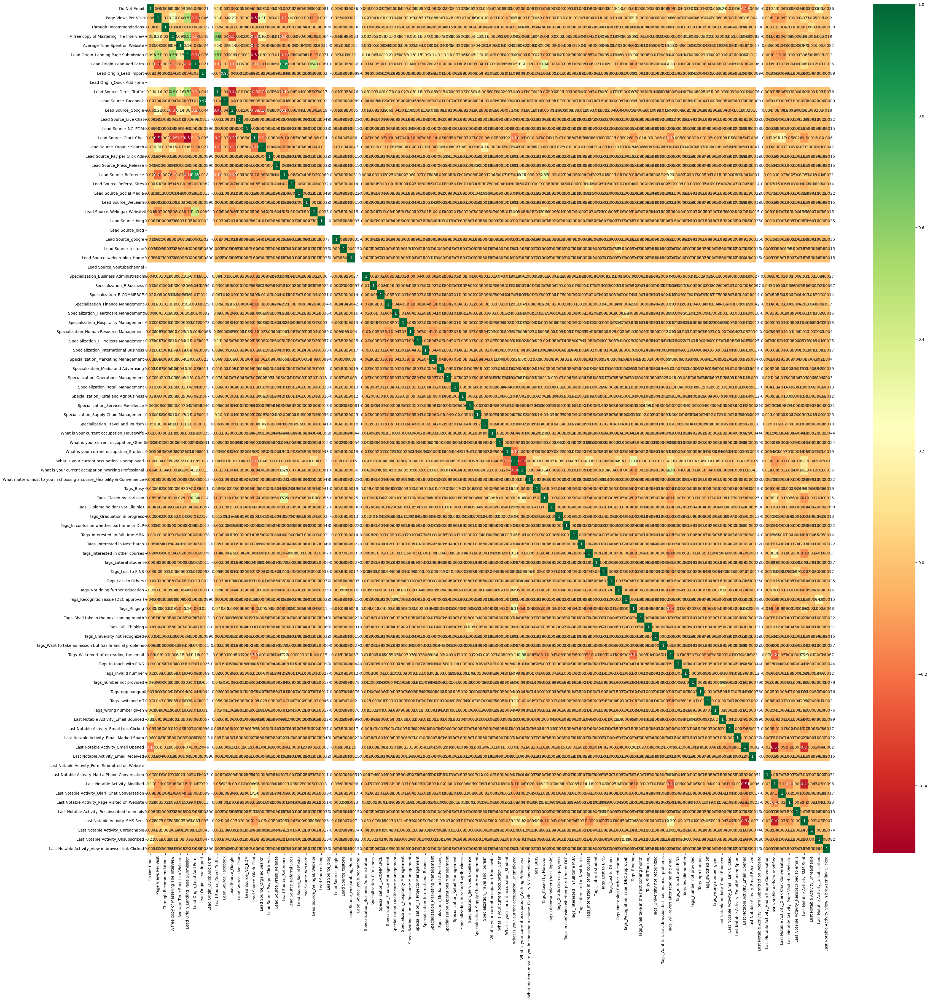

In [187]:
plt.figure(figsize = (40,40))
sns.heatmap(X_train.corr(),cmap='RdYlGn',annot = True)
plt.show()

In [188]:
X_train['Lead Origin_Quick Add Form'].value_counts()

Lead Origin_Quick Add Form
0    6458
Name: count, dtype: int64

In [189]:
data['Lead Origin_Quick Add Form'].value_counts()

Lead Origin_Quick Add Form
0    9225
1       1
Name: count, dtype: int64

### Step 7: Model Building

In [190]:
import statsmodels.api as sm

#### Running the first model

In [191]:
#Logistic Regression Model

logm1 = sm.GLM(y_train,(sm.add_constant(X_train)),family=sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6369
Model Family:                Binomial   Df Model:                           88
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1284.5
Date:                Mon, 18 Mar 2024   Deviance:                       2569.1
Time:                        01:03:07   Pearson chi2:                 1.08e+04
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6098
Covariance Type:            nonrobust                                         
===========================================================================================================================================
                                                                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------------------------------------------
const                                                                      42.1189   2.39e+05      0.000      1.000   -4.68e+05    4.68e+05
Do Not Email                                                               -1.3852      0.286     -4.851      0.000      -1.945      -0.826
Page Views Per Visit                                                        1.7471      0.537      3.254      0.001       0.695       2.800
Through Recommendations                                                     0.5440      3.532      0.154      0.878      -6.379       7.467
A free copy of Mastering The Interview                                     -0.0909      0.175     -0.519      0.604      -0.434       0.252
Average Time Spent on Website                                               5.0917      0.493     10.335      0.000       4.126       6.057
Lead Origin_Landing Page Submission                                        -0.3858      0.207     -1.867      0.062      -0.791       0.019
Lead Origin_Lead Add Form                                                   1.8851      0.779      2.419      0.016       0.358       3.413
Lead Origin_Lead Import                                                    21.7367   3.21e+04      0.001      0.999    -6.3e+04     6.3e+04
Lead Origin_Quick Add Form                                               4.279e-09   3.35e-05      0.000      1.000   -6.57e-05    6.57e-05
Lead Source_Direct Traffic                                                -22.5849   8.11e+04     -0.000      1.000   -1.59e+05    1.59e+05
Lead Source_Facebook                                                      -44.3360   8.73e+04     -0.001      1.000   -1.71e+05    1.71e+05
Lead Source_Google                                                        -22.0439   8.11e+04     -0.000      1.000   -1.59e+05    1.59e+05
Lead Source_Live Chat                                                      -3.5157   1.78e+05  -1.97e-05      1.000   -3.49e+05    3.49e+05
Lead Source_NC_EDM                                                          5.8285    2.3e+05   2.54e-05      1.000    -4.5e+05     4.5e+05
Lead Source_Olark Chat                                                    -21.7401   8.11e+04     -0.000      1.000   -1.59e+05    1.59e+05
Lead Source_Organic Search                                                -21.9993   8.11e+04     -0.000      1.000   -1.59e+05    1.59e+05
Lead Source_Pay per Click Ads                                             -42.9304   2.31e+05     -0.000      1.000   -4.53e+05    4.52e+05
Lead Source_Press_Release                                                 -44.6084   2.32e+05     -0.000      1.000   -4.54e+05    4.54e+05
Lea

### Step 8: Feature Selection Using RFE


In [193]:
from sklearn.linear_model import LogisticRegression
logreg=LogisticRegression()

In [194]:
from sklearn.feature_selection import RFE
rfe=RFE(logreg,n_features_to_select=25)
rfe=rfe.fit(X_train,y_train)

In [195]:
rfe.support_

array([ True, False, False, False,  True, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False,  True,  True, False, False,  True,
        True,  True, False,  True, False,  True,  True,  True, False,
        True, False,  True, False, False, False, False,  True, False,
        True,  True,  True,  True,  True, False, False, False, False,
       False, False, False,  True,  True, False, False,  True, False,
       False, False])

In [196]:
list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('Do Not Email', True, 1),
 ('Page Views Per Visit', False, 8),
 ('Through Recommendations', False, 49),
 ('A free copy of Mastering The Interview', False, 50),
 ('Average Time Spent on Website', True, 1),
 ('Lead Origin_Landing Page Submission', False, 20),
 ('Lead Origin_Lead Add Form', True, 1),
 ('Lead Origin_Lead Import', False, 42),
 ('Lead Origin_Quick Add Form', False, 68),
 ('Lead Source_Direct Traffic', False, 6),
 ('Lead Source_Facebook', False, 9),
 ('Lead Source_Google', False, 63),
 ('Lead Source_Live Chat', False, 64),
 ('Lead Source_NC_EDM', False, 3),
 ('Lead Source_Olark Chat', False, 48),
 ('Lead Source_Organic Search', False, 52),
 ('Lead Source_Pay per Click Ads', False, 61),
 ('Lead Source_Press_Release', False, 51),
 ('Lead Source_Reference', True, 1),
 ('Lead Source_Referral Sites', False, 19),
 ('Lead Source_Social Media', False, 53),
 ('Lead Source_WeLearn', False, 60),
 ('Lead Source_Welingak Website', True, 1),
 ('Lead Source_bing', False, 29),
 ('Lead Sour

In [197]:
col=X_train.columns[rfe.support_]

In [198]:
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Origin_Lead Add Form', 'Lead Source_Reference',
       'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Diploma holder (Not Eligible)',
       'Tags_Graduation in progress', 'Tags_Interested  in full time MBA',
       'Tags_Interested in other courses', 'Tags_Lateral student',
       'Tags_Lost to EINS', 'Tags_Not doing further education', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_number not provided', 'Tags_opp hangup', 'Tags_switched off',
       'Tags_wrong number given', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

##### Assessing the model with StatsModels

In [199]:
X_train_sm = sm.add_constant(X_train[col])
logm2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6432
Model Family:                Binomial   Df Model:                           25
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1334.1
Date:                Mon, 18 Mar 2024   Deviance:                       2668.2
Time:                        01:03:10   Pearson chi2:                 9.61e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6037
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3808      0.106    -22.492      0.000      -2.588      -2.173
Do Not Email                                            -1.4098      0.243     -5.798      0.000      -1.886      -0.933
Average Time Spent on Website                            4.4801      0.434     10.333      0.000       3.630       5.330
Lead Origin_Lead Add Form                                1.8468      0.671      2.752      0.006       0.531       3.162
Lead Source_Reference                                   -1.4660      0.747     -1.961      0.050      -2.931      -0.001
Lead Source_Welingak Website                             3.0152      1.230      2.451      0.014       0.604       5.426
What is your current occupation_Unemployed               1.5362      0.114     13.427      0.000       1.312       1.760
What is your current occupation_Working Professional     1.9583      0.356      5.500      0.000       1.260       2.656
Tags_Closed by Horizzon                                  5.8213      0.737      7.904      0.000       4.378       7.265
Tags_Diploma holder (Not Eligible)                     -24.4619   3.34e+04     -0.001      0.999   -6.55e+04    6.55e+04
Tags_Graduation in progress                             -1.3901      0.468     -2.969      0.003      -2.308      -0.472
Tags_Interested  in full time MBA                       -2.1086      0.607     -3.474      0.001      -3.298      -0.919
Tags_Interested in other courses                        -2.5718      0.340     -7.564      0.000      -3.238      -1.905
Tags_Lateral student                                    26.4876   1.13e+05      0.000      1.000   -2.22e+05    2.22e+05
Tags_Lost to EINS                                        5.0343      0.527      9.553      0.000       4.001       6.067
Tags_Not doing further education                       -24.3156   1.98e+04     -0.001      0.999   -3.89e+04    3.88e+04
Tags_Ringing                                            -4.1627      0.232    -17.961      0.000      -4.617      -3.708
Tags_Will revert after reading the email                 3.8224      0.191     20.050      0.000       3.449       4.196
Tags_invalid number                                     -5.0274      1.059     -4.748      0.000      -7.103      -2.952
Tags_number not provided                               -25.8472   3.78e+04     -0.001      0.999   -7.41e+04     7.4e+04
Tags_opp hangup                                         -2.3583      0.680     -3.469      0.001      -3.691      -1.026
Tags_switched off                                       -4.8105      0.602     -7.985      0.000      -5.991      -3.630
Tags_wrong number given                                -25

In [200]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.092063
4328    0.092047
3650    0.022540
1051    0.976708
8706    0.004895
8963    0.959773
6158    0.993273
3077    0.997897
2177    0.016918
2932    0.995309
dtype: float64

##### Creating a dataframe with the actual churn flag and the predicted probabilities

In [201]:
y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID
0,0,0.092063,4678
1,0,0.092047,4328
2,0,0.022540,3650
3,1,0.976708,1051
4,0,0.004895,8706


In [202]:
### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.092063,4678,0
1,0,0.092047,4328,0
2,0,0.022540,3650,0
3,1,0.976708,1051,1
4,0,0.004895,8706,0


#### Checking the metrics - Accuracy, Precision and Recall

Recall - The ratio of true positive to Actual positive ( We need to have high sensitivity such we do not miss on any lead that can be converted)


Precision - Ratio of True Positive to Total positives predicted ( As high as possible since we do not want to waste the resources in trying to work on those leads that do not convert)

In [203]:
from sklearn import metrics

In [204]:
conf_matrix = metrics.confusion_matrix(y_train_pred_df.Converted,y_train_pred_df.Predicted)
conf_matrix

array([[3851,   79],
       [ 478, 2050]], dtype=int64)

In [205]:
accuracy=metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted)
accuracy

0.9137503871167544

#### Metrics beyond simply accuracy

In [206]:
TP = conf_matrix[1,1] # true positive 
TN = conf_matrix[0,0] # true negatives
FP = conf_matrix[0,1] # false positives
FN = conf_matrix[1,0] # false negatives

In [207]:
# Precision - A high precision indicates that the model has a low rate of false positives, meaning that when it predicts a positive instance, it is likely to be correct.

precision = TP / (TP + FP)
precision

0.9628933771723814

In [208]:
# Recall - A high recall indicates that the model has a low rate of false negatives, meaning that it can successfully identify most positive instances in the dataset.

recall = TP / (TP+FN)
recall

0.8109177215189873

#### Checking for multicollinearity (VIF)

In [209]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [210]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,Lead Origin_Lead Add Form,16.09
3,Lead Source_Reference,13.00
5,What is your current occupation_Unemployed,4.53
4,Lead Source_Welingak Website,4.12
16,Tags_Will revert after reading the email,2.69
15,Tags_Ringing,1.83
6,What is your current occupation_Working Profes...,1.81
24,Last Notable Activity_SMS Sent,1.63
22,Last Notable Activity_Modified,1.57
1,Average Time Spent on Website,1.54


There are a few variables with high VIF. It's best to drop these variables as they aren't helping much with prediction and unnecessarily making the model complex. The variable 'Lead Origin_Lead Add Form' has the highest VIF. So let's start by dropping that.

In [211]:
col=col.drop('Lead Origin_Lead Add Form',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Reference', 'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Diploma holder (Not Eligible)',
       'Tags_Graduation in progress', 'Tags_Interested  in full time MBA',
       'Tags_Interested in other courses', 'Tags_Lateral student',
       'Tags_Lost to EINS', 'Tags_Not doing further education', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_number not provided', 'Tags_opp hangup', 'Tags_switched off',
       'Tags_wrong number given', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

#### model 3

In [212]:
X_train_sm = sm.add_constant(X_train[col])
logm3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6433
Model Family:                Binomial   Df Model:                           24
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1338.1
Date:                Mon, 18 Mar 2024   Deviance:                       2676.2
Time:                        01:03:10   Pearson chi2:                 9.58e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6032
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3828      0.106    -22.515      0.000      -2.590      -2.175
Do Not Email                                            -1.3473      0.237     -5.676      0.000      -1.812      -0.882
Average Time Spent on Website                            4.4220      0.432     10.226      0.000       3.574       5.270
Lead Source_Reference                                    0.3559      0.342      1.039      0.299      -0.315       1.027
Lead Source_Welingak Website                             4.8123      1.039      4.631      0.000       2.776       6.849
What is your current occupation_Unemployed               1.5600      0.114     13.689      0.000       1.337       1.783
What is your current occupation_Working Professional     1.9642      0.356      5.520      0.000       1.267       2.662
Tags_Closed by Horizzon                                  5.8093      0.737      7.884      0.000       4.365       7.254
Tags_Diploma holder (Not Eligible)                     -24.4869   3.34e+04     -0.001      0.999   -6.56e+04    6.55e+04
Tags_Graduation in progress                             -1.4153      0.468     -3.025      0.002      -2.332      -0.498
Tags_Interested  in full time MBA                       -2.1297      0.607     -3.511      0.000      -3.319      -0.941
Tags_Interested in other courses                        -2.5944      0.340     -7.637      0.000      -3.260      -1.929
Tags_Lateral student                                    26.4560   1.13e+05      0.000      1.000   -2.22e+05    2.22e+05
Tags_Lost to EINS                                        5.0197      0.527      9.528      0.000       3.987       6.052
Tags_Not doing further education                       -24.3533   1.98e+04     -0.001      0.999   -3.89e+04    3.89e+04
Tags_Ringing                                            -4.1737      0.232    -18.025      0.000      -4.628      -3.720
Tags_Will revert after reading the email                 3.8176      0.190     20.056      0.000       3.445       4.191
Tags_invalid number                                     -5.0479      1.058     -4.773      0.000      -7.121      -2.975
Tags_number not provided                               -25.8814   3.78e+04     -0.001      0.999   -7.42e+04    7.41e+04
Tags_opp hangup                                         -2.3852      0.680     -3.509      0.000      -3.717      -1.053
Tags_switched off                                       -4.8385      0.602     -8.033      0.000      -6.019      -3.658
Tags_wrong number given                                -25.5921   3.89e+04     -0.001      0.999   -7.62e+04    7.62e+04
Last Notable Activity_Modified                          -0

In [213]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.091794
4328    0.091779
3650    0.022670
1051    0.976870
8706    0.005288
8963    0.960328
6158    0.993547
3077    0.997926
2177    0.017080
2932    0.995238
dtype: float64

In [214]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.091794,4678,0
1,0,0.091779,4328,0
2,0,0.022670,3650,0
3,1,0.976870,1051,1
4,0,0.005288,8706,0


In [215]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.9135955404149891


The overall accuracy has not dropped much

In [216]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,What is your current occupation_Unemployed,4.52
15,Tags_Will revert after reading the email,2.68
14,Tags_Ringing,1.83
5,What is your current occupation_Working Profes...,1.81
23,Last Notable Activity_SMS Sent,1.63
21,Last Notable Activity_Modified,1.57
1,Average Time Spent on Website,1.54
6,Tags_Closed by Horizzon,1.46
2,Lead Source_Reference,1.36
10,Tags_Interested in other courses,1.36


The column 'Tags_Diploma holder (Not Eligible)' has high p-value (0.99).Lets drop it

In [217]:
# Let's drop Tags_Diploma holder (Not Eligible since it has a high VIF
col = col.drop('Tags_Diploma holder (Not Eligible)',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Reference', 'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Graduation in progress',
       'Tags_Interested  in full time MBA', 'Tags_Interested in other courses',
       'Tags_Lateral student', 'Tags_Lost to EINS',
       'Tags_Not doing further education', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_number not provided', 'Tags_opp hangup', 'Tags_switched off',
       'Tags_wrong number given', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

#### Model 4

In [218]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6434
Model Family:                Binomial   Df Model:                           23
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1349.4
Date:                Mon, 18 Mar 2024   Deviance:                       2698.9
Time:                        01:03:11   Pearson chi2:                 9.77e+03
No. Iterations:                    24   Pseudo R-squ. (CS):             0.6018
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3939      0.106    -22.590      0.000      -2.602      -2.186
Do Not Email                                            -1.3373      0.237     -5.649      0.000      -1.801      -0.873
Average Time Spent on Website                            4.4602      0.431     10.342      0.000       3.615       5.306
Lead Source_Reference                                    0.3711      0.343      1.081      0.279      -0.301       1.044
Lead Source_Welingak Website                             4.8819      1.039      4.697      0.000       2.845       6.919
What is your current occupation_Unemployed               1.5032      0.113     13.244      0.000       1.281       1.726
What is your current occupation_Working Professional     1.8650      0.346      5.385      0.000       1.186       2.544
Tags_Closed by Horizzon                                  5.8795      0.737      7.982      0.000       4.436       7.323
Tags_Graduation in progress                             -1.3468      0.468     -2.875      0.004      -2.265      -0.429
Tags_Interested  in full time MBA                       -2.0581      0.607     -3.393      0.001      -3.247      -0.869
Tags_Interested in other courses                        -2.5272      0.340     -7.431      0.000      -3.194      -1.861
Tags_Lateral student                                    26.5322   1.13e+05      0.000      1.000   -2.21e+05    2.21e+05
Tags_Lost to EINS                                        5.0636      0.526      9.621      0.000       4.032       6.095
Tags_Not doing further education                       -24.2913   1.98e+04     -0.001      0.999   -3.89e+04    3.88e+04
Tags_Ringing                                            -4.1307      0.231    -17.851      0.000      -4.584      -3.677
Tags_Will revert after reading the email                 3.8802      0.190     20.424      0.000       3.508       4.253
Tags_invalid number                                     -5.0084      1.059     -4.732      0.000      -7.083      -2.934
Tags_number not provided                               -25.8359   3.78e+04     -0.001      0.999    -7.4e+04     7.4e+04
Tags_opp hangup                                         -2.3366      0.681     -3.433      0.001      -3.671      -1.003
Tags_switched off                                       -4.7952      0.602     -7.962      0.000      -5.976      -3.615
Tags_wrong number given                                -25.5443   3.88e+04     -0.001      0.999   -7.61e+04     7.6e+04
Last Notable Activity_Modified                          -0.9525      0.127     -7.499      0.000      -1.201      -0.704
Last Notable Activity_Olark Chat Conversation           -1

In [219]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.090940
4328    0.090926
3650    0.022427
1051    0.976897
8706    0.005279
8963    0.960190
6158    0.993778
3077    0.997980
2177    0.016854
2932    0.995320
dtype: float64

In [220]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.090940,4678,0
1,0,0.090926,4328,0
2,0,0.022427,3650,0
3,1,0.976897,1051,1
4,0,0.005279,8706,0


In [221]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.9137503871167544


The overall accuracy has not changed

In [222]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,What is your current occupation_Unemployed,4.36
14,Tags_Will revert after reading the email,2.64
13,Tags_Ringing,1.80
5,What is your current occupation_Working Profes...,1.79
22,Last Notable Activity_SMS Sent,1.62
20,Last Notable Activity_Modified,1.57
1,Average Time Spent on Website,1.53
6,Tags_Closed by Horizzon,1.45
2,Lead Source_Reference,1.36
9,Tags_Interested in other courses,1.34


In [223]:
#The feature 'Tags_Not doing further education' has high pvalue lets drop
col=col.drop('Tags_Not doing further education',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Reference', 'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Graduation in progress',
       'Tags_Interested  in full time MBA', 'Tags_Interested in other courses',
       'Tags_Lateral student', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_number not provided', 'Tags_opp hangup', 'Tags_switched off',
       'Tags_wrong number given', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

#### Model 5

In [224]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm5 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm5.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6435
Model Family:                Binomial   Df Model:                           22
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1371.8
Date:                Mon, 18 Mar 2024   Deviance:                       2743.6
Time:                        01:03:11   Pearson chi2:                 1.02e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5991
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3850      0.106    -22.593      0.000      -2.592      -2.178
Do Not Email                                            -1.4978      0.229     -6.544      0.000      -1.946      -1.049
Average Time Spent on Website                            4.3808      0.422     10.372      0.000       3.553       5.209
Lead Source_Reference                                    0.3997      0.344      1.160      0.246      -0.275       1.075
Lead Source_Welingak Website                             5.0520      1.045      4.835      0.000       3.004       7.100
What is your current occupation_Unemployed               1.3998      0.113     12.417      0.000       1.179       1.621
What is your current occupation_Working Professional     1.8107      0.350      5.180      0.000       1.126       2.496
Tags_Closed by Horizzon                                  5.9758      0.736      8.121      0.000       4.534       7.418
Tags_Graduation in progress                             -1.2335      0.469     -2.629      0.009      -2.153      -0.314
Tags_Interested  in full time MBA                       -1.9372      0.606     -3.195      0.001      -3.126      -0.749
Tags_Interested in other courses                        -2.4061      0.340     -7.082      0.000      -3.072      -1.740
Tags_Lateral student                                    25.6630   6.82e+04      0.000      1.000   -1.34e+05    1.34e+05
Tags_Lost to EINS                                        5.1436      0.526      9.778      0.000       4.113       6.175
Tags_Ringing                                            -4.0472      0.231    -17.538      0.000      -4.499      -3.595
Tags_Will revert after reading the email                 3.9825      0.189     21.019      0.000       3.611       4.354
Tags_invalid number                                     -4.9219      1.057     -4.656      0.000      -6.994      -2.850
Tags_number not provided                               -24.7180   2.27e+04     -0.001      0.999   -4.46e+04    4.45e+04
Tags_opp hangup                                         -2.2411      0.683     -3.283      0.001      -3.579      -0.903
Tags_switched off                                       -4.7086      0.602     -7.819      0.000      -5.889      -3.528
Tags_wrong number given                                -24.4232   2.34e+04     -0.001      0.999   -4.58e+04    4.58e+04
Last Notable Activity_Modified                          -0.9940      0.126     -7.892      0.000      -1.241      -0.747
Last Notable Activity_Olark Chat Conversation           -1.3677      0.439     -3.113      0.002      -2.229      -0.507
Last Notable Activity_SMS Sent                           2

In [225]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.091543
4328    0.091528
3650    0.021875
1051    0.976768
8706    0.004432
8963    0.960354
6158    0.993404
3077    0.998020
2177    0.016521
2932    0.995460
dtype: float64

In [226]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.091543,4678,0
1,0,0.091528,4328,0
2,0,0.021875,3650,0
3,1,0.976768,1051,1
4,0,0.004432,8706,0


In [227]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.9132858470114587


The overall accuracy has not dropped much

In [228]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,What is your current occupation_Unemployed,4.08
13,Tags_Will revert after reading the email,2.56
5,What is your current occupation_Working Profes...,1.76
12,Tags_Ringing,1.74
21,Last Notable Activity_SMS Sent,1.62
19,Last Notable Activity_Modified,1.56
1,Average Time Spent on Website,1.53
6,Tags_Closed by Horizzon,1.44
2,Lead Source_Reference,1.36
9,Tags_Interested in other courses,1.32


In [229]:
# The column 'Tags_Lateral student' has high p value lets drop it
col=col.drop('Tags_Lateral student',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Reference', 'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Graduation in progress',
       'Tags_Interested  in full time MBA', 'Tags_Interested in other courses',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_number not provided', 'Tags_opp hangup', 'Tags_switched off',
       'Tags_wrong number given', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

#### Model 6

In [230]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm6 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm6.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6436
Model Family:                Binomial   Df Model:                           21
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1375.6
Date:                Mon, 18 Mar 2024   Deviance:                       2751.1
Time:                        01:03:12   Pearson chi2:                 1.01e+04
No. Iterations:                    23   Pseudo R-squ. (CS):             0.5986
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3885      0.106    -22.622      0.000      -2.595      -2.182
Do Not Email                                            -1.5064      0.229     -6.586      0.000      -1.955      -1.058
Average Time Spent on Website                            4.3718      0.422     10.358      0.000       3.545       5.199
Lead Source_Reference                                    0.4123      0.342      1.204      0.229      -0.259       1.084
Lead Source_Welingak Website                             5.0376      1.045      4.822      0.000       2.990       7.085
What is your current occupation_Unemployed               1.4106      0.113     12.535      0.000       1.190       1.631
What is your current occupation_Working Professional     1.8152      0.349      5.199      0.000       1.131       2.500
Tags_Closed by Horizzon                                  5.9521      0.735      8.095      0.000       4.511       7.393
Tags_Graduation in progress                             -1.2483      0.469     -2.662      0.008      -2.167      -0.329
Tags_Interested  in full time MBA                       -1.9517      0.606     -3.220      0.001      -3.140      -0.764
Tags_Interested in other courses                        -2.4201      0.339     -7.129      0.000      -3.085      -1.755
Tags_Lost to EINS                                        5.1301      0.526      9.754      0.000       4.099       6.161
Tags_Ringing                                            -4.0566      0.231    -17.583      0.000      -4.509      -3.604
Tags_Will revert after reading the email                 3.9693      0.189     20.994      0.000       3.599       4.340
Tags_invalid number                                     -4.9305      1.057     -4.665      0.000      -7.002      -2.859
Tags_number not provided                               -24.7265   2.27e+04     -0.001      0.999   -4.46e+04    4.45e+04
Tags_opp hangup                                         -2.2501      0.683     -3.297      0.001      -3.588      -0.912
Tags_switched off                                       -4.7176      0.602     -7.834      0.000      -5.898      -3.537
Tags_wrong number given                                -24.4324   2.34e+04     -0.001      0.999   -4.58e+04    4.58e+04
Last Notable Activity_Modified                          -0.9767      0.125     -7.789      0.000      -1.222      -0.731
Last Notable Activity_Olark Chat Conversation           -1.3669      0.439     -3.114      0.002      -2.227      -0.506
Last Notable Activity_SMS Sent                           2.4485      0.134     18.313      0.000       2.186       2.711
==========================================================

In [231]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.091237
4328    0.091222
3650    0.022081
1051    0.976600
8706    0.004440
8963    0.960115
6158    0.993319
3077    0.998010
2177    0.016687
2932    0.995443
dtype: float64

In [232]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.091237,4678,0
1,0,0.091222,4328,0
2,0,0.022081,3650,0
3,1,0.976600,1051,1
4,0,0.004440,8706,0


In [233]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.9129761536079282


In [234]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,What is your current occupation_Unemployed,4.08
12,Tags_Will revert after reading the email,2.56
5,What is your current occupation_Working Profes...,1.76
11,Tags_Ringing,1.74
20,Last Notable Activity_SMS Sent,1.62
18,Last Notable Activity_Modified,1.56
1,Average Time Spent on Website,1.53
6,Tags_Closed by Horizzon,1.44
2,Lead Source_Reference,1.36
9,Tags_Interested in other courses,1.32


In [235]:
# The feature 'Tags_number not provided' has high pvalue . lets drop it
col=col.drop('Tags_number not provided',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Reference', 'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Graduation in progress',
       'Tags_Interested  in full time MBA', 'Tags_Interested in other courses',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_opp hangup', 'Tags_switched off', 'Tags_wrong number given',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

#### Model 7

In [236]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm7 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm7.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6437
Model Family:                Binomial   Df Model:                           20
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1391.2
Date:                Mon, 18 Mar 2024   Deviance:                       2782.5
Time:                        01:03:12   Pearson chi2:                 9.86e+03
No. Iterations:                    22   Pseudo R-squ. (CS):             0.5966
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3716      0.105    -22.607      0.000      -2.577      -2.166
Do Not Email                                            -1.5734      0.226     -6.960      0.000      -2.017      -1.130
Average Time Spent on Website                            4.3741      0.420     10.412      0.000       3.551       5.198
Lead Source_Reference                                    0.4287      0.343      1.251      0.211      -0.243       1.101
Lead Source_Welingak Website                             5.1073      1.047      4.880      0.000       3.056       7.158
What is your current occupation_Unemployed               1.3525      0.112     12.115      0.000       1.134       1.571
What is your current occupation_Working Professional     1.7767      0.350      5.083      0.000       1.092       2.462
Tags_Closed by Horizzon                                  5.9733      0.735      8.128      0.000       4.533       7.414
Tags_Graduation in progress                             -1.2043      0.467     -2.577      0.010      -2.120      -0.288
Tags_Interested  in full time MBA                       -1.9135      0.606     -3.157      0.002      -3.101      -0.726
Tags_Interested in other courses                        -2.3700      0.338     -7.007      0.000      -3.033      -1.707
Tags_Lost to EINS                                        5.1395      0.526      9.777      0.000       4.109       6.170
Tags_Ringing                                            -3.9663      0.229    -17.331      0.000      -4.415      -3.518
Tags_Will revert after reading the email                 4.0047      0.189     21.212      0.000       3.635       4.375
Tags_invalid number                                     -4.8362      1.056     -4.579      0.000      -6.906      -2.766
Tags_opp hangup                                         -2.1665      0.680     -3.185      0.001      -3.500      -0.833
Tags_switched off                                       -4.6222      0.601     -7.686      0.000      -5.801      -3.444
Tags_wrong number given                                -23.3313   1.42e+04     -0.002      0.999   -2.78e+04    2.78e+04
Last Notable Activity_Modified                          -0.9748      0.125     -7.789      0.000      -1.220      -0.730
Last Notable Activity_Olark Chat Conversation           -1.3509      0.439     -3.078      0.002      -2.211      -0.491
Last Notable Activity_SMS Sent                           2.3903      0.131     18.194      0.000       2.133       2.648
========================================================================================================================
"""

In [237]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.092652
4328    0.092637
3650    0.022319
1051    0.976476
8706    0.004148
8963    0.959897
6158    0.992645
3077    0.997880
2177    0.016865
2932    0.995426
dtype: float64

In [238]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.092652,4678,0
1,0,0.092637,4328,0
2,0,0.022319,3650,0
3,1,0.976476,1051,1
4,0,0.004148,8706,0


In [239]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.9056983586249613


In [240]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,What is your current occupation_Unemployed,4.02
12,Tags_Will revert after reading the email,2.54
5,What is your current occupation_Working Profes...,1.75
11,Tags_Ringing,1.72
19,Last Notable Activity_SMS Sent,1.62
17,Last Notable Activity_Modified,1.56
1,Average Time Spent on Website,1.53
6,Tags_Closed by Horizzon,1.43
2,Lead Source_Reference,1.36
9,Tags_Interested in other courses,1.31


In [241]:
#Lets drop 'Tags_wrong number given' as it has high p-value
col=col.drop('Tags_wrong number given',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Reference', 'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Graduation in progress',
       'Tags_Interested  in full time MBA', 'Tags_Interested in other courses',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_opp hangup', 'Tags_switched off',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

#### Model 8

In [242]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm8 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm8.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6438
Model Family:                Binomial   Df Model:                           19
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1403.2
Date:                Mon, 18 Mar 2024   Deviance:                       2806.3
Time:                        01:03:12   Pearson chi2:                 9.68e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5952
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3618      0.105    -22.600      0.000      -2.567      -2.157
Do Not Email                                            -1.6490      0.224     -7.374      0.000      -2.087      -1.211
Average Time Spent on Website                            4.4464      0.419     10.606      0.000       3.625       5.268
Lead Source_Reference                                    0.4495      0.343      1.310      0.190      -0.223       1.122
Lead Source_Welingak Website                             5.1764      1.049      4.935      0.000       3.120       7.232
What is your current occupation_Unemployed               1.3076      0.111     11.782      0.000       1.090       1.525
What is your current occupation_Working Professional     1.7468      0.350      4.991      0.000       1.061       2.433
Tags_Closed by Horizzon                                  5.9903      0.734      8.156      0.000       4.551       7.430
Tags_Graduation in progress                             -1.1686      0.466     -2.506      0.012      -2.083      -0.255
Tags_Interested  in full time MBA                       -1.8863      0.606     -3.111      0.002      -3.075      -0.698
Tags_Interested in other courses                        -2.3337      0.338     -6.914      0.000      -2.995      -1.672
Tags_Lost to EINS                                        5.1490      0.526      9.797      0.000       4.119       6.179
Tags_Ringing                                            -3.8972      0.228    -17.129      0.000      -4.343      -3.451
Tags_Will revert after reading the email                 4.0342      0.189     21.380      0.000       3.664       4.404
Tags_invalid number                                     -4.7675      1.057     -4.510      0.000      -6.839      -2.696
Tags_opp hangup                                         -2.1009      0.678     -3.098      0.002      -3.430      -0.772
Tags_switched off                                       -4.5462      0.601     -7.567      0.000      -5.724      -3.369
Last Notable Activity_Modified                          -0.9790      0.125     -7.830      0.000      -1.224      -0.734
Last Notable Activity_Olark Chat Conversation           -1.3423      0.439     -3.057      0.002      -2.203      -0.482
Last Notable Activity_SMS Sent                           2.3416      0.130     18.069      0.000       2.088       2.596
========================================================================================================================
"""

In [243]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.093607
4328    0.093592
3650    0.022467
1051    0.976629
8706    0.003802
8963    0.959804
6158    0.991957
3077    0.997791
2177    0.016900
2932    0.995439
dtype: float64

In [244]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.093607,4678,0
1,0,0.093592,4328,0
2,0,0.022467,3650,0
3,1,0.976629,1051,1
4,0,0.003802,8706,0


In [245]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.9038401982037783


In [246]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,What is your current occupation_Unemployed,3.96
12,Tags_Will revert after reading the email,2.52
5,What is your current occupation_Working Profes...,1.74
11,Tags_Ringing,1.71
18,Last Notable Activity_SMS Sent,1.62
16,Last Notable Activity_Modified,1.56
1,Average Time Spent on Website,1.53
6,Tags_Closed by Horizzon,1.43
2,Lead Source_Reference,1.36
9,Tags_Interested in other courses,1.31


In [247]:
# The feature 'Lead Source_Reference' has high p value, lets drop it
col=col.drop('Lead Source_Reference',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Graduation in progress',
       'Tags_Interested  in full time MBA', 'Tags_Interested in other courses',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_opp hangup', 'Tags_switched off',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

#### Model 9

In [248]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm9 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm9.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6439
Model Family:                Binomial   Df Model:                           18
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1404.0
Date:                Mon, 18 Mar 2024   Deviance:                       2808.1
Time:                        01:03:13   Pearson chi2:                 9.91e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5950
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3592      0.104    -22.605      0.000      -2.564      -2.155
Do Not Email                                            -1.6277      0.222     -7.342      0.000      -2.062      -1.193
Average Time Spent on Website                            4.3977      0.417     10.537      0.000       3.580       5.216
Lead Source_Welingak Website                             5.1612      1.048      4.925      0.000       3.107       7.215
What is your current occupation_Unemployed               1.3083      0.111     11.804      0.000       1.091       1.526
What is your current occupation_Working Professional     1.7764      0.349      5.083      0.000       1.091       2.461
Tags_Closed by Horizzon                                  6.1983      0.721      8.594      0.000       4.785       7.612
Tags_Graduation in progress                             -1.1722      0.466     -2.514      0.012      -2.086      -0.259
Tags_Interested  in full time MBA                       -1.8803      0.606     -3.102      0.002      -3.068      -0.692
Tags_Interested in other courses                        -2.3316      0.337     -6.910      0.000      -2.993      -1.670
Tags_Lost to EINS                                        5.1686      0.525      9.844      0.000       4.140       6.198
Tags_Ringing                                            -3.8851      0.227    -17.107      0.000      -4.330      -3.440
Tags_Will revert after reading the email                 4.1089      0.183     22.496      0.000       3.751       4.467
Tags_invalid number                                     -4.7663      1.056     -4.513      0.000      -6.836      -2.696
Tags_opp hangup                                         -2.1039      0.678     -3.102      0.002      -3.433      -0.775
Tags_switched off                                       -4.5500      0.601     -7.574      0.000      -5.727      -3.373
Last Notable Activity_Modified                          -0.9721      0.125     -7.787      0.000      -1.217      -0.727
Last Notable Activity_Olark Chat Conversation           -1.3524      0.442     -3.062      0.002      -2.218      -0.487
Last Notable Activity_SMS Sent                           2.3446      0.130     18.105      0.000       2.091       2.598
========================================================================================================================
"""

In [249]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.093745
4328    0.093730
3650    0.022595
1051    0.978171
8706    0.003946
8963    0.962634
6158    0.992055
3077    0.997944
2177    0.017049
2932    0.994220
dtype: float64

In [250]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.093745,4678,0
1,0,0.093730,4328,0
2,0,0.022595,3650,0
3,1,0.978171,1051,1
4,0,0.003946,8706,0


In [251]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.903685351502013


In [252]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,What is your current occupation_Unemployed,3.96
11,Tags_Will revert after reading the email,2.44
4,What is your current occupation_Working Profes...,1.72
10,Tags_Ringing,1.71
17,Last Notable Activity_SMS Sent,1.61
15,Last Notable Activity_Modified,1.56
1,Average Time Spent on Website,1.51
8,Tags_Interested in other courses,1.31
5,Tags_Closed by Horizzon,1.26
14,Tags_switched off,1.14


In [253]:
#Lets remove 'Tags_Graduation in progress' that has higher p-value
col= col.drop('Tags_Graduation in progress',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website',
       'What is your current occupation_Unemployed',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Interested  in full time MBA',
       'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_opp hangup', 'Tags_switched off',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 10

In [254]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm10 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm10.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6440
Model Family:                Binomial   Df Model:                           17
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1408.2
Date:                Mon, 18 Mar 2024   Deviance:                       2816.3
Time:                        01:03:13   Pearson chi2:                 1.00e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5945
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -2.3650      0.104    -22.646      0.000      -2.570      -2.160
Do Not Email                                            -1.6027      0.222     -7.220      0.000      -2.038      -1.168
Average Time Spent on Website                            4.4406      0.417     10.651      0.000       3.623       5.258
Lead Source_Welingak Website                             5.2131      1.048      4.976      0.000       3.160       7.267
What is your current occupation_Unemployed               1.2656      0.110     11.502      0.000       1.050       1.481
What is your current occupation_Working Professional     1.7561      0.351      5.007      0.000       1.069       2.443
Tags_Closed by Horizzon                                  6.2554      0.721      8.676      0.000       4.842       7.669
Tags_Interested  in full time MBA                       -1.8266      0.606     -3.013      0.003      -3.015      -0.638
Tags_Interested in other courses                        -2.2818      0.338     -6.758      0.000      -2.944      -1.620
Tags_Lost to EINS                                        5.2074      0.525      9.925      0.000       4.179       6.236
Tags_Ringing                                            -3.8505      0.227    -16.974      0.000      -4.295      -3.406
Tags_Will revert after reading the email                 4.1531      0.182     22.797      0.000       3.796       4.510
Tags_invalid number                                     -4.7349      1.057     -4.480      0.000      -6.807      -2.663
Tags_opp hangup                                         -2.0662      0.679     -3.045      0.002      -3.396      -0.736
Tags_switched off                                       -4.5155      0.601     -7.518      0.000      -5.693      -3.338
Last Notable Activity_Modified                          -0.9976      0.124     -8.021      0.000      -1.241      -0.754
Last Notable Activity_Olark Chat Conversation           -1.3584      0.442     -3.073      0.002      -2.225      -0.492
Last Notable Activity_SMS Sent                           2.3566      0.129     18.224      0.000       2.103       2.610
========================================================================================================================
"""

In [255]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.093325
4328    0.093310
3650    0.022188
1051    0.978231
8706    0.003965
8963    0.962540
6158    0.992367
3077    0.997975
2177    0.016695
2932    0.994268
dtype: float64

In [256]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.093325,4678,0
1,0,0.093310,4328,0
2,0,0.022188,3650,0
3,1,0.978231,1051,1
4,0,0.003965,8706,0


In [257]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.9027562712914214


In [258]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
3,What is your current occupation_Unemployed,3.80
10,Tags_Will revert after reading the email,2.39
4,What is your current occupation_Working Profes...,1.70
9,Tags_Ringing,1.68
16,Last Notable Activity_SMS Sent,1.61
14,Last Notable Activity_Modified,1.55
1,Average Time Spent on Website,1.51
7,Tags_Interested in other courses,1.29
5,Tags_Closed by Horizzon,1.25
13,Tags_switched off,1.14


In [259]:
# drop 'What is your current occupation_Unemployed' that has higher VIF

col = col.drop('What is your current occupation_Unemployed',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Interested  in full time MBA',
       'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_opp hangup', 'Tags_switched off',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 11

In [260]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm11 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm11.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6441
Model Family:                Binomial   Df Model:                           16
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1476.0
Date:                Mon, 18 Mar 2024   Deviance:                       2952.1
Time:                        01:03:13   Pearson chi2:                 9.56e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5859
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.7800      0.082    -21.713      0.000      -1.941      -1.619
Do Not Email                                            -1.4132      0.218     -6.484      0.000      -1.840      -0.986
Average Time Spent on Website                            4.4949      0.408     11.021      0.000       3.696       5.294
Lead Source_Welingak Website                             5.8458      1.042      5.611      0.000       3.804       7.888
What is your current occupation_Working Professional     0.8078      0.352      2.295      0.022       0.118       1.498
Tags_Closed by Horizzon                                  6.8075      0.719      9.465      0.000       5.398       8.217
Tags_Interested  in full time MBA                       -1.2009      0.604     -1.987      0.047      -2.386      -0.016
Tags_Interested in other courses                        -1.6586      0.335     -4.958      0.000      -2.314      -1.003
Tags_Lost to EINS                                        5.3925      0.520     10.363      0.000       4.373       6.412
Tags_Ringing                                            -3.1986      0.218    -14.678      0.000      -3.626      -2.771
Tags_Will revert after reading the email                 4.6615      0.178     26.232      0.000       4.313       5.010
Tags_invalid number                                     -4.0858      1.056     -3.869      0.000      -6.156      -2.016
Tags_opp hangup                                         -1.4136      0.676     -2.090      0.037      -2.739      -0.088
Tags_switched off                                       -3.8721      0.597     -6.484      0.000      -5.043      -2.702
Last Notable Activity_Modified                          -1.0395      0.122     -8.511      0.000      -1.279      -0.800
Last Notable Activity_Olark Chat Conversation           -1.3911      0.432     -3.223      0.001      -2.237      -0.545
Last Notable Activity_SMS Sent                           2.3801      0.125     19.014      0.000       2.135       2.625
========================================================================================================================
"""

In [261]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.156090
4328    0.156066
3650    0.020278
1051    0.974475
8706    0.004348
8963    0.955912
6158    0.993522
3077    0.997674
2177    0.015197
2932    0.993487
dtype: float64

In [262]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.156090,4678,0
1,0,0.156066,4328,0
2,0,0.020278,3650,0
3,1,0.974475,1051,1
4,0,0.004348,8706,0


In [263]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.8978011768349334


In [264]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
9,Tags_Will revert after reading the email,1.69
15,Last Notable Activity_SMS Sent,1.51
1,Average Time Spent on Website,1.46
13,Last Notable Activity_Modified,1.46
3,What is your current occupation_Working Profes...,1.31
4,Tags_Closed by Horizzon,1.13
8,Tags_Ringing,1.12
0,Do Not Email,1.11
6,Tags_Interested in other courses,1.11
7,Tags_Lost to EINS,1.05


In [265]:
## drop 'Tags_Interested in full time MBA' dur higheer p value

col=col.drop('Tags_Interested  in full time MBA',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Interested in other courses',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_opp hangup', 'Tags_switched off',
       'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

#### Model 12

In [266]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm12 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm12.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6442
Model Family:                Binomial   Df Model:                           15
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1478.8
Date:                Mon, 18 Mar 2024   Deviance:                       2957.6
Time:                        01:03:13   Pearson chi2:                 9.68e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5856
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.7962      0.082    -21.958      0.000      -1.957      -1.636
Do Not Email                                            -1.4044      0.218     -6.439      0.000      -1.832      -0.977
Average Time Spent on Website                            4.4804      0.407     11.010      0.000       3.683       5.278
Lead Source_Welingak Website                             5.8647      1.042      5.629      0.000       3.823       7.907
What is your current occupation_Working Professional     0.7700      0.345      2.230      0.026       0.093       1.447
Tags_Closed by Horizzon                                  6.8407      0.719      9.512      0.000       5.431       8.250
Tags_Interested in other courses                        -1.6345      0.335     -4.885      0.000      -2.290      -0.979
Tags_Lost to EINS                                        5.4227      0.520     10.423      0.000       4.403       6.442
Tags_Ringing                                            -3.1931      0.218    -14.647      0.000      -3.620      -2.766
Tags_Will revert after reading the email                 4.6872      0.178     26.393      0.000       4.339       5.035
Tags_invalid number                                     -4.0806      1.056     -3.864      0.000      -6.150      -2.011
Tags_opp hangup                                         -1.4060      0.677     -2.077      0.038      -2.733      -0.079
Tags_switched off                                       -3.8678      0.597     -6.477      0.000      -5.038      -2.697
Last Notable Activity_Modified                          -1.0513      0.122     -8.621      0.000      -1.290      -0.812
Last Notable Activity_Olark Chat Conversation           -1.3953      0.431     -3.234      0.001      -2.241      -0.550
Last Notable Activity_SMS Sent                           2.3950      0.125     19.147      0.000       2.150       2.640
========================================================================================================================
"""

In [267]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.153929
4328    0.153906
3650    0.020161
1051    0.974650
8706    0.014037
8963    0.956285
6158    0.993689
3077    0.997724
2177    0.015123
2932    0.993596
dtype: float64

In [268]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.153929,4678,0
1,0,0.153906,4328,0
2,0,0.020161,3650,0
3,1,0.974650,1051,1
4,0,0.014037,8706,0


In [269]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.897491483431403


In [270]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Tags_Will revert after reading the email,1.69
14,Last Notable Activity_SMS Sent,1.51
1,Average Time Spent on Website,1.46
12,Last Notable Activity_Modified,1.44
3,What is your current occupation_Working Profes...,1.31
4,Tags_Closed by Horizzon,1.13
7,Tags_Ringing,1.12
0,Do Not Email,1.11
5,Tags_Interested in other courses,1.11
6,Tags_Lost to EINS,1.05


In [271]:
# LEts drop 'Tags_opp hangup' due to higher p-value
col=col.drop('Tags_opp hangup',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website',
       'What is your current occupation_Working Professional',
       'Tags_Closed by Horizzon', 'Tags_Interested in other courses',
       'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 13

In [272]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm13 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm13.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6443
Model Family:                Binomial   Df Model:                           14
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1481.5
Date:                Mon, 18 Mar 2024   Deviance:                       2962.9
Time:                        01:03:13   Pearson chi2:                 9.56e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5852
Covariance Type:            nonrobust                                         
========================================================================================================================
                                                           coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------------------
const                                                   -1.8054      0.082    -22.079      0.000      -1.966      -1.645
Do Not Email                                            -1.4056      0.218     -6.447      0.000      -1.833      -0.978
Average Time Spent on Website                            4.4776      0.406     11.023      0.000       3.681       5.274
Lead Source_Welingak Website                             5.8733      1.042      5.638      0.000       3.832       7.915
What is your current occupation_Working Professional     0.7728      0.345      2.238      0.025       0.096       1.450
Tags_Closed by Horizzon                                  6.8460      0.719      9.520      0.000       5.437       8.255
Tags_Interested in other courses                        -1.6247      0.334     -4.860      0.000      -2.280      -0.969
Tags_Lost to EINS                                        5.4283      0.520     10.435      0.000       4.409       6.448
Tags_Ringing                                            -3.1716      0.218    -14.580      0.000      -3.598      -2.745
Tags_Will revert after reading the email                 4.6951      0.178     26.448      0.000       4.347       5.043
Tags_invalid number                                     -4.0580      1.056     -3.844      0.000      -6.127      -1.989
Tags_switched off                                       -3.8458      0.597     -6.442      0.000      -5.016      -2.676
Last Notable Activity_Modified                          -1.0472      0.122     -8.589      0.000      -1.286      -0.808
Last Notable Activity_Olark Chat Conversation           -1.3871      0.432     -3.213      0.001      -2.233      -0.541
Last Notable Activity_SMS Sent                           2.3805      0.124     19.129      0.000       2.137       2.624
========================================================================================================================
"""

In [273]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.152734
4328    0.152710
3650    0.020249
1051    0.974608
8706    0.013951
8963    0.956228
6158    0.993585
3077    0.997687
2177    0.015192
2932    0.993572
dtype: float64

In [274]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.152734,4678,0
1,0,0.152710,4328,0
2,0,0.020249,3650,0
3,1,0.974608,1051,1
4,0,0.013951,8706,0


In [275]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.8971817900278725


In [276]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,Tags_Will revert after reading the email,1.69
13,Last Notable Activity_SMS Sent,1.51
1,Average Time Spent on Website,1.46
11,Last Notable Activity_Modified,1.43
3,What is your current occupation_Working Profes...,1.31
4,Tags_Closed by Horizzon,1.13
7,Tags_Ringing,1.12
0,Do Not Email,1.11
5,Tags_Interested in other courses,1.11
6,Tags_Lost to EINS,1.05


In [277]:
#Lets drop 'What is your current occupation_Working Professional' due to pvalue
col=col.drop('What is your current occupation_Working Professional',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website', 'Tags_Closed by Horizzon',
       'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Last Notable Activity_Modified',
       'Last Notable Activity_Olark Chat Conversation',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 14

In [278]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm14 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm14.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6444
Model Family:                Binomial   Df Model:                           13
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1484.1
Date:                Mon, 18 Mar 2024   Deviance:                       2968.2
Time:                        01:03:14   Pearson chi2:                 1.00e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5849
Covariance Type:            nonrobust                                         
=================================================================================================================
                                                    coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------------------
const                                            -1.7983      0.082    -22.023      0.000      -1.958      -1.638
Do Not Email                                     -1.4127      0.219     -6.464      0.000      -1.841      -0.984
Average Time Spent on Website                     4.4709      0.406     11.009      0.000       3.675       5.267
Lead Source_Welingak Website                      5.8675      1.042      5.632      0.000       3.825       7.910
Tags_Closed by Horizzon                           7.0159      0.717      9.789      0.000       5.611       8.421
Tags_Interested in other courses                 -1.5834      0.334     -4.741      0.000      -2.238      -0.929
Tags_Lost to EINS                                 5.5232      0.519     10.640      0.000       4.506       6.541
Tags_Ringing                                     -3.1727      0.218    -14.583      0.000      -3.599      -2.746
Tags_Will revert after reading the email          4.8163      0.173     27.855      0.000       4.477       5.155
Tags_invalid number                              -4.0606      1.056     -3.847      0.000      -6.129      -1.992
Tags_switched off                                -3.8446      0.597     -6.439      0.000      -5.015      -2.674
Last Notable Activity_Modified                   -1.0450      0.122     -8.578      0.000      -1.284      -0.806
Last Notable Activity_Olark Chat Conversation    -1.4051      0.435     -3.233      0.001      -2.257      -0.553
Last Notable Activity_SMS Sent                    2.3767      0.124     19.114      0.000       2.133       2.620
=================================================================================================================
"""

In [279]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.153640
4328    0.153617
3650    0.021260
1051    0.977573
8706    0.013983
8963    0.961285
6158    0.993525
3077    0.997955
2177    0.015961
2932    0.994609
dtype: float64

In [280]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.153640,4678,0
1,0,0.153617,4328,0
2,0,0.021260,3650,0
3,1,0.977573,1051,1
4,0,0.013983,8706,0


In [281]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.8973366367296377


In [282]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
12,Last Notable Activity_SMS Sent,1.50
1,Average Time Spent on Website,1.46
7,Tags_Will revert after reading the email,1.46
10,Last Notable Activity_Modified,1.43
6,Tags_Ringing,1.12
0,Do Not Email,1.11
4,Tags_Interested in other courses,1.11
3,Tags_Closed by Horizzon,1.08
5,Tags_Lost to EINS,1.04
2,Lead Source_Welingak Website,1.03


In [283]:
#Lets drop 'Last Notable Activity_Olark Chat Conversation' due to p-value
col=col.drop('Last Notable Activity_Olark Chat Conversation',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website', 'Tags_Closed by Horizzon',
       'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Last Notable Activity_Modified',
       'Last Notable Activity_SMS Sent'],
      dtype='object')

### Model 15

In [284]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm15 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm15.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6445
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1491.2
Date:                Mon, 18 Mar 2024   Deviance:                       2982.4
Time:                        01:03:14   Pearson chi2:                 1.01e+04
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5840
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -1.8641      0.080    -23.187      0.000      -2.022      -1.707
Do Not Email                                -1.4220      0.219     -6.496      0.000      -1.851      -0.993
Average Time Spent on Website                4.4734      0.405     11.052      0.000       3.680       5.267
Lead Source_Welingak Website                 5.8939      1.041      5.662      0.000       3.853       7.934
Tags_Closed by Horizzon                      7.0214      0.717      9.798      0.000       5.617       8.426
Tags_Interested in other courses            -1.5684      0.334     -4.696      0.000      -2.223      -0.914
Tags_Lost to EINS                            5.5104      0.519     10.619      0.000       4.493       6.527
Tags_Ringing                                -3.1626      0.218    -14.512      0.000      -3.590      -2.735
Tags_Will revert after reading the email     4.8339      0.173     27.997      0.000       4.495       5.172
Tags_invalid number                         -4.0567      1.056     -3.842      0.000      -6.126      -1.987
Tags_switched off                           -3.8361      0.597     -6.422      0.000      -5.007      -2.665
Last Notable Activity_Modified              -0.9819      0.121     -8.111      0.000      -1.219      -0.745
Last Notable Activity_SMS Sent               2.4405      0.124     19.727      0.000       2.198       2.683
============================================================================================================
"""

In [285]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.145273
4328    0.145251
3650    0.021521
1051    0.976498
8706    0.013815
8963    0.959450
6158    0.993620
3077    0.997987
2177    0.016156
2932    0.994275
dtype: float64

In [286]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.145273,4678,0
1,0,0.145251,4328,0
2,0,0.021521,3650,0
3,1,0.976498,1051,1
4,0,0.013815,8706,0


In [287]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.897491483431403


In [288]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
11,Last Notable Activity_SMS Sent,1.50
1,Average Time Spent on Website,1.46
7,Tags_Will revert after reading the email,1.46
10,Last Notable Activity_Modified,1.43
6,Tags_Ringing,1.12
0,Do Not Email,1.11
4,Tags_Interested in other courses,1.11
3,Tags_Closed by Horizzon,1.08
5,Tags_Lost to EINS,1.04
2,Lead Source_Welingak Website,1.03


In [289]:
#Lets try to drop 'Last Notable Activity_SMS Sent'
col=col.drop('Last Notable Activity_SMS Sent',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website', 'Tags_Closed by Horizzon',
       'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_invalid number',
       'Tags_switched off', 'Last Notable Activity_Modified'],
      dtype='object')

### Model 16

In [290]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm16 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm16.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6446
Model Family:                Binomial   Df Model:                           11
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1718.6
Date:                Mon, 18 Mar 2024   Deviance:                       3437.1
Time:                        01:03:14   Pearson chi2:                 7.02e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5536
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -1.1140      0.060    -18.425      0.000      -1.232      -0.995
Do Not Email                                -1.1974      0.209     -5.730      0.000      -1.607      -0.788
Average Time Spent on Website                4.9961      0.387     12.914      0.000       4.238       5.754
Lead Source_Welingak Website                 6.0493      1.028      5.886      0.000       4.035       8.064
Tags_Closed by Horizzon                      6.9598      0.718      9.688      0.000       5.552       8.368
Tags_Interested in other courses            -1.7561      0.323     -5.435      0.000      -2.389      -1.123
Tags_Lost to EINS                            5.4203      0.523     10.372      0.000       4.396       6.445
Tags_Ringing                                -2.3932      0.201    -11.899      0.000      -2.787      -1.999
Tags_Will revert after reading the email     4.8131      0.170     28.254      0.000       4.479       5.147
Tags_invalid number                         -3.0493      1.030     -2.960      0.003      -5.069      -1.030
Tags_switched off                           -2.9050      0.588     -4.943      0.000      -4.057      -1.753
Last Notable Activity_Modified              -1.8019      0.112    -16.134      0.000      -2.021      -1.583
============================================================================================================
"""

In [291]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.266730
4328    0.266691
3650    0.017904
1051    0.989488
8706    0.016091
8963    0.980465
6158    0.976749
3077    0.989929
2177    0.012983
2932    0.997116
dtype: float64

In [292]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.266730,4678,0
1,0,0.266691,4328,0
2,0,0.017904,3650,0
3,1,0.989488,1051,1
4,0,0.016091,8706,0


In [293]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.887116754413131


In [294]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Average Time Spent on Website,1.41
10,Last Notable Activity_Modified,1.38
7,Tags_Will revert after reading the email,1.21
0,Do Not Email,1.10
4,Tags_Interested in other courses,1.10
3,Tags_Closed by Horizzon,1.08
6,Tags_Ringing,1.05
5,Tags_Lost to EINS,1.04
2,Lead Source_Welingak Website,1.01
8,Tags_invalid number,1.01


In [295]:
## LEts drop 'Tags_invalid number'

col=col.drop('Tags_invalid number',1)
col

Index(['Do Not Email', 'Average Time Spent on Website',
       'Lead Source_Welingak Website', 'Tags_Closed by Horizzon',
       'Tags_Interested in other courses', 'Tags_Lost to EINS', 'Tags_Ringing',
       'Tags_Will revert after reading the email', 'Tags_switched off',
       'Last Notable Activity_Modified'],
      dtype='object')

### Model 17

In [296]:
# Let's re-run the model using the selected variables
X_train_sm = sm.add_constant(X_train[col])
logm17 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm17.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:              Converted   No. Observations:                 6458
Model:                            GLM   Df Residuals:                     6447
Model Family:                Binomial   Df Model:                           10
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -1730.6
Date:                Mon, 18 Mar 2024   Deviance:                       3461.1
Time:                        01:03:14   Pearson chi2:                 7.00e+03
No. Iterations:                     8   Pseudo R-squ. (CS):             0.5519
Covariance Type:            nonrobust                                         
============================================================================================================
                                               coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------------------------
const                                       -1.1443      0.060    -19.013      0.000      -1.262      -1.026
Do Not Email                                -1.2043      0.208     -5.783      0.000      -1.612      -0.796
Average Time Spent on Website                4.9904      0.386     12.937      0.000       4.234       5.746
Lead Source_Welingak Website                 6.0742      1.028      5.911      0.000       4.060       8.088
Tags_Closed by Horizzon                      6.9748      0.718      9.710      0.000       5.567       8.383
Tags_Interested in other courses            -1.7310      0.323     -5.360      0.000      -2.364      -1.098
Tags_Lost to EINS                            5.4357      0.523     10.403      0.000       4.412       6.460
Tags_Ringing                                -2.3631      0.201    -11.755      0.000      -2.757      -1.969
Tags_Will revert after reading the email     4.8365      0.170     28.416      0.000       4.503       5.170
Tags_switched off                           -2.8750      0.588     -4.893      0.000      -4.027      -1.723
Last Notable Activity_Modified              -1.7847      0.112    -15.993      0.000      -2.003      -1.566
============================================================================================================
"""

In [297]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

4678    0.260815
4328    0.260776
3650    0.018100
1051    0.989406
8706    0.015776
8963    0.980328
6158    0.976467
3077    0.989849
2177    0.013131
2932    0.997072
dtype: float64

In [298]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_train_pred_df = pd.DataFrame({'Converted':y_train.values,'Conv_Prob':y_train_pred})
y_train_pred_df['CustID']=y_train.index
y_train_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_train_pred_df['Predicted']=y_train_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted
0,0,0.260815,4678,0
1,0,0.260776,4328,0
2,0,0.018100,3650,0
3,1,0.989406,1051,1
4,0,0.015776,8706,0


In [299]:
# Let's check the overall accuracy.
print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted))

0.8869619077113657


In [300]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col].columns
vif['VIF'] = [variance_inflation_factor(X_train[col].values, i) for i in range(X_train[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,Average Time Spent on Website,1.41
9,Last Notable Activity_Modified,1.38
7,Tags_Will revert after reading the email,1.21
4,Tags_Interested in other courses,1.10
0,Do Not Email,1.09
3,Tags_Closed by Horizzon,1.08
6,Tags_Ringing,1.05
5,Tags_Lost to EINS,1.04
2,Lead Source_Welingak Website,1.01
8,Tags_switched off,1.01


In [301]:
## Metrics beyond simply accuracy

conf_matrix=metrics.confusion_matrix(y_train_pred_df.Converted,y_train_pred_df.Predicted)
conf_matrix

array([[3876,   54],
       [ 676, 1852]], dtype=int64)

#### Accuracy

In [302]:
accuracy=metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Predicted)
accuracy

0.8869619077113657

## Metrics beyond simply accuracy

In [303]:
TP = conf_matrix[1,1] # true positive 
TN = conf_matrix[0,0] # true negatives
FP = conf_matrix[0,1] # false positives
FN = conf_matrix[1,0] # false negatives

#### Recall

In [304]:
# Recall - A high recall indicates that the model has a low rate of false negatives, meaning that it can successfully identify most positive instances in the dataset.

recall = TP / (TP+FN)
recall

0.7325949367088608

#### Precision

In [305]:
# Precision - A high precision indicates that the model has a low rate of false positives, meaning that when it predicts a positive instance, it is likely to be correct.

precision = TP / (TP + FP)
precision

0.9716684155299056

### Step 9: Plotting the ROC Curve

An ROC curve demonstrates several things:

- It shows the tradeoff between sensitivity and specificity (any increase in sensitivity will be accompanied by a decrease in specificity).
- The closer the curve follows the left-hand border and then the top border of the ROC space, the more accurate the test.
- The closer the curve comes to the 45-degree diagonal of the ROC space, the less accurate the test.

In [306]:
def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [307]:
fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_df.Converted, y_train_pred_df.Conv_Prob, drop_intermediate = False )

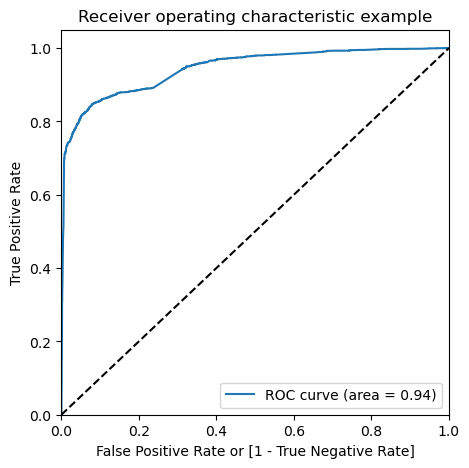

In [308]:
draw_roc(y_train_pred_df.Converted, y_train_pred_df.Conv_Prob)

### Step 10: Finding Optimal Cutoff Point

In [309]:
from sklearn.metrics import precision_score, recall_score

In [310]:
precision_score(y_train_pred_df.Converted, y_train_pred_df.Predicted)

0.9716684155299056

In [311]:
recall_score(y_train_pred_df.Converted, y_train_pred_df.Predicted)

0.7325949367088608

### Precision and recall tradeoff

In [312]:
from sklearn.metrics import precision_recall_curve

In [313]:
p, r, thresholds = precision_recall_curve(y_train_pred_df.Converted, y_train_pred_df.Conv_Prob)

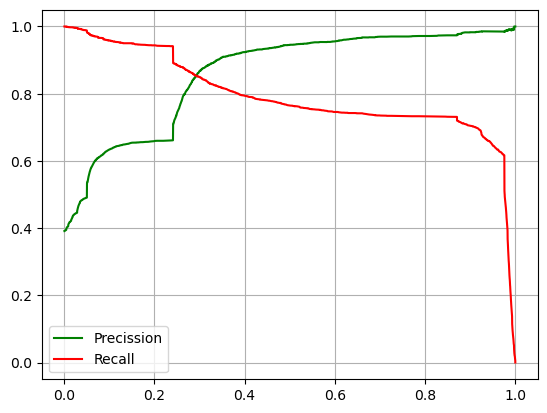

In [314]:
plt.plot(thresholds, p[:-1], "g-", label='Precission')
plt.plot(thresholds, r[:-1], "r-", label = 'Recall')
plt.legend()
plt.grid(True)
plt.show()

### Step 10: Finding Optimal Cutoff Point

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [315]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_df[i]= y_train_pred_df.Conv_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.260815,4678,0,1,1,1,0,0,0,0,0,0,0
1,0,0.260776,4328,0,1,1,1,0,0,0,0,0,0,0
2,0,0.018100,3650,0,1,0,0,0,0,0,0,0,0,0
3,1,0.989406,1051,1,1,1,1,1,1,1,1,1,1,1
4,0,0.015776,8706,0,1,0,0,0,0,0,0,0,0,0


In [316]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_df.Converted, y_train_pred_df[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.391452  1.000000  0.000000
0.1   0.1  0.766646  0.958070  0.643511
0.2   0.2  0.786931  0.943829  0.686005
0.3   0.3  0.889904  0.849288  0.916031
0.4   0.4  0.893620  0.793908  0.957761
0.5   0.5  0.890523  0.764636  0.971501
0.6   0.6  0.886962  0.745649  0.977863
0.7   0.7  0.887272  0.734968  0.985242
0.8   0.8  0.886962  0.732595  0.986260
0.9   0.9  0.879529  0.704509  0.992112


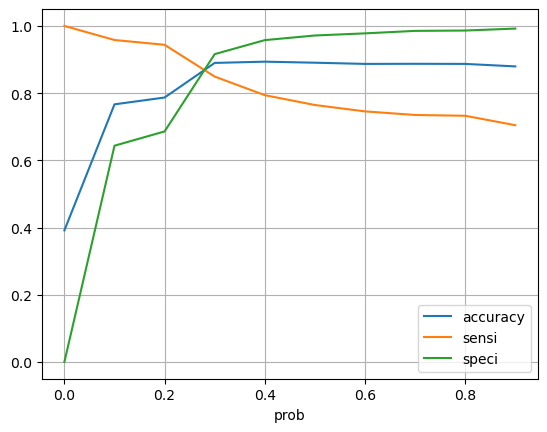

In [317]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.grid(True)
plt.show()

### From the curve above, 0.3 is the optimum point to take it as a cutoff probability.

In [318]:
y_train_pred_df['Optimum_Predicted']=y_train_pred_df.Conv_Prob.map(lambda x:1 if x>0.3 else 0)

In [319]:
#Check accuracy for the optimal cut-off value

print(metrics.accuracy_score(y_train_pred_df.Converted,y_train_pred_df.Optimum_Predicted))

0.8899039950449056


#### Precision

In [320]:
precision_score(y_train_pred_df.Converted, y_train_pred_df.Optimum_Predicted)

0.8667743237787646

#### Recall

In [321]:
recall_score(y_train_pred_df.Converted,y_train_pred_df.Optimum_Predicted)

0.8492879746835443

In [322]:
conf_matrix=metrics.confusion_matrix(y_train_pred_df.Converted,y_train_pred_df.Optimum_Predicted)
conf_matrix

array([[3600,  330],
       [ 381, 2147]], dtype=int64)

In [323]:
TP = conf_matrix[1,1] # true positive 
TN = conf_matrix[0,0] # true negatives
FP = conf_matrix[0,1] # false positives
FN = conf_matrix[1,0] # false negatives

In [324]:
sensitivity = (TP)/(TP+FN)
sensitivity

0.8492879746835443

In [325]:
specificity = (TN) / (TN+FP)
specificity

0.916030534351145

- The model has good Recall score of 84.92% and is meeting the CEO expection of 80% conversion rate
- Also the Precision score is high 86.6% indicating most of the actual true values are correctly predicted

In [349]:
print('Classification Report of the Logistic Regression Model')
print('\n')
print(metrics.classification_report(y_train_pred_df.Converted,y_train_pred_df.Optimum_Predicted))

Classification Report of the Logistic Regression Model


              precision    recall  f1-score   support

           0       0.90      0.92      0.91      3930
           1       0.87      0.85      0.86      2528

    accuracy                           0.89      6458
   macro avg       0.89      0.88      0.88      6458
weighted avg       0.89      0.89      0.89      6458



#### Validating the model metrics using cross validation

In [326]:
from sklearn.model_selection import cross_validate

In [327]:
evaluation_results=cross_validate(LogisticRegression(),X_train[col],y_train,cv=10,scoring=['accuracy','precision','recall','f1'])

In [328]:
cross_validation_results=pd.DataFrame(evaluation_results)

In [329]:
cross_validation_results

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
0,0.031894,0.006977,0.902477,0.970297,0.774704,0.861538
1,0.022931,0.007967,0.871517,0.916667,0.739130,0.818381
2,0.020928,0.006980,0.874613,0.913462,0.750988,0.824295
3,0.021925,0.006976,0.890093,0.959596,0.750988,0.842572
4,0.027918,0.005977,0.885449,0.954315,0.743083,0.835556
5,0.027899,0.006511,0.888545,0.964103,0.743083,0.839286
6,0.021926,0.006981,0.904025,0.956938,0.790514,0.865801
7,0.023916,0.006979,0.890093,0.955000,0.754941,0.843267
8,0.023925,0.007965,0.896124,0.960199,0.765873,0.852097
9,0.021928,0.007973,0.888372,0.959184,0.746032,0.839286


In [330]:
cross_validation_results.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
fit_time,10.0,0.024519,0.003554,0.020928,0.021927,0.023424,0.026906,0.031894
score_time,10.0,0.007128,0.000661,0.005977,0.006976,0.006979,0.007719,0.007973
test_accuracy,10.0,0.889131,0.010468,0.871517,0.886180,0.889319,0.894616,0.904025
test_precision,10.0,0.950976,0.019493,0.913462,0.954486,0.958061,0.960048,0.970297
test_recall,10.0,0.755934,0.016355,0.739130,0.743820,0.750988,0.763140,0.790514
test_f1,10.0,0.842208,0.014830,0.818381,0.836488,0.840929,0.849890,0.865801


The above metrics are obtained by sklearn.cross_Validation considering a default threshold of 0.5.
And looking at the results we see that values are closely bound indicating the model performance is in a close range and near to the model evaluation metrics and peforms descent on a unseen data

### Step 11: Making predictions on the test set

In [331]:
X_test[['Average Time Spent on Website','Page Views Per Visit']] = scaler.transform(X_test[['Average Time Spent on Website','Page Views Per Visit']])

In [332]:
X_test=X_test[col]
X_test.head()

,Do Not Email,Average Time Spent on Website,Lead Source_Welingak Website,Tags_Closed by Horizzon,Tags_Interested in other courses,Tags_Lost to EINS,Tags_Ringing,Tags_Will revert after reading the email,Tags_switched off,Last Notable Activity_Modified
3224,0,0.045491,0,0,0,0,1,0,0,0
4864,0,0.000000,0,0,0,0,1,0,0,1
4937,0,0.037882,0,0,0,0,1,0,0,0
7987,0,0.153861,0,0,0,1,0,0,0,1
1641,0,0.000000,0,0,0,0,0,0,0,0


Making predictions on the test set

In [333]:
y_test_pred = res.predict(sm.add_constant(X_test))

In [334]:
y_test_pred[:10]

3224    0.036249
4864    0.005006
4937    0.034945
7987    0.963544
1641    0.241525
7662    0.052180
4660    0.087172
1272    0.055827
1997    0.185770
6522    0.029101
dtype: float64

In [335]:
### Creating a dataframe with the actual churn flag and the predicted probabilities

y_test_pred_df = pd.DataFrame({'Converted':y_test.values,'Conv_Prob':y_test_pred})
y_test_pred_df['CustID']=y_test.index
y_test_pred_df.reset_index(drop=True,inplace=True)


### Creating a new column 'Predicted' with 1 if COnv_Prob > 0.8 else 0 (since the CEO wants 80% conversion rate, so we need to pick candidates that more than 80% chances to convert)

y_test_pred_df['Predicted']=y_test_pred_df['Conv_Prob'].map(lambda x : 1 if x > 0.8 else 0)
y_test_pred_df['Optimum_Predicted']=y_test_pred_df.Conv_Prob.map(lambda x:1 if x>0.3 else 0)
y_test_pred_df.head()

,Converted,Conv_Prob,CustID,Predicted,Optimum_Predicted
0,0,0.036249,3224,0,0
1,0,0.005006,4864,0,0
2,0,0.034945,4937,0,0
3,1,0.963544,7987,1,1
4,0,0.241525,1641,0,0


#### Accuracy Score of model prediction on test data

In [336]:
print(metrics.accuracy_score(y_test_pred_df.Converted,y_test_pred_df.Optimum_Predicted))

0.8919797687861272


#### Precision Score

In [337]:
precision_score(y_test_pred_df.Converted, y_test_pred_df.Optimum_Predicted)

0.8479087452471483

#### Recall Score

In [338]:
recall_score(y_test_pred_df.Converted,y_test_pred_df.Optimum_Predicted)

0.8651794374393792

In [351]:
print('Classification Report of the Logistic Regression Model')
print('\n')
print(metrics.classification_report(y_test_pred_df.Converted,y_test_pred_df.Optimum_Predicted))

Classification Report of the Logistic Regression Model


              precision    recall  f1-score   support

           0       0.92      0.91      0.91      1737
           1       0.85      0.87      0.86      1031

    accuracy                           0.89      2768
   macro avg       0.88      0.89      0.88      2768
weighted avg       0.89      0.89      0.89      2768



### Plotting gain chart for Model prediction on test data

In [339]:
from scikitplot.metrics import plot_cumulative_gain

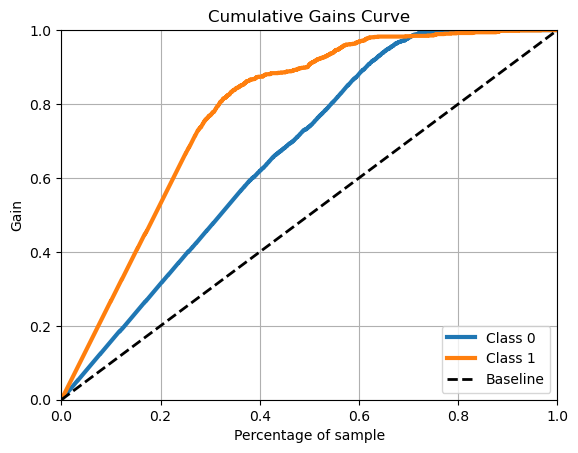

In [340]:
y_prob_pos = res.predict(sm.add_constant(X_test))
y_prob_neg=1-y_prob_pos
y_prob=np.column_stack((y_prob_neg, y_prob_pos))
plot_cumulative_gain(y_test,y_prob)
plt.show()

- The Class 1 curve i.e. the positive class probability (Lead Conversion) is far away from the base line
- From the Gain Curve, we can see that by contacting top 30% of the customers (sorted list of predicted probabilities) would result is approaching 80% of the Leads who are likely to convert

### Find the KS-Statistic

In [341]:
from scipy.stats import ks_2samp

In [342]:
ks_statistic, p_value = ks_2samp(y_prob_pos, y_prob_neg)

In [343]:
print("KS Statistic:", ks_statistic)

KS Statistic: 0.3782514450867052


 - A good model will have KS Statistic 40% or more. And current model is near to the good value

### Lead Score for test data set

In [344]:
# Assigning the lead score to each of the leads based on model prediction
Lead_Score = round((res.predict(sm.add_constant(X_test)))*100,2)

In [345]:
Lead_Score.head()

3224     3.62
4864     0.50
4937     3.49
7987    96.35
1641    24.15
dtype: float64

#### important variables of the model

##### Average Time Spent on Website (Coefficient = 4.9904): 
Significant with a large coefficient, indicating a strong positive effect on the outcome for each unit increase in avearge time spent on the website.

##### Tags_switched off (Coefficient = -2.8750): 
Also significant but with a negative impact, suggesting that the tag swtiched off indicates less in the likelihood of the outcome.

##### Tags_closed by horizzon (Coefficient = 6.9748): 
Another highly impactful variable, suggesting that leads with this tag have a higher likelihood of a positive outcome.

##### Lead Source_welingak website (Coefficient = 6.0742): 
Shows a strong positive association with the outcome, indicating that leads coming from the Welingak website are more likely to have a positive outcome.

##### Tags_Lost to EINS (Coefficient = 5.4347): 
This variable has a significant positive impact, indicating that leads with this tag are much more likely to result in a positive outcome.


##### Tags_will revert after reading the email (Coefficient = 4.8365): 
This variable has a significant positive impact, indicating that leads with this tag are much more likely to result in a positive outcome.


- The top 3 features contributing significantly towards explaining the lead conversion

1. Tags_Closed by Horizzon
2. Lead Source_Welingak Website
2. Tags_Lost to EINS

The Top 3 Categorical variables that must be concentrated to increase the Lead COnversion are 

1. Tags
2. Lead Source
3. Average Time Spent on Website